<a href="https://colab.research.google.com/github/MyrtooS/Explainability-Methods-for-Brain-Tumor-Classification/blob/main/Binary_MRI_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!ls '/content/drive'
folder='/content/drive/My Drive/MRI Classification/mri_kaggle'

Mounted at /content/drive
MyDrive  Shareddrives


In [ ]:
!pip install tf-explain
from tf_explain.core.smoothgrad import SmoothGrad

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 43 kB 2.5 MB/s 


In [ ]:
import sys
sys.path.append('/content/drive/My Drive/MRI Classification/pyfiles')
import grad_cam
import ig_efficientnet
import smoothgrad
import lime
import effnet_preprocess
import saliency
import gap_preprocess
import vgg_preprocess
import binary_predict
import ig_binary
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential,Model,load_model
import matplotlib.pyplot as plt

Φόρτωμα εικονών για ερμηνεία

In [ ]:
image_h1 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Healthy/Not Cancer  (4).jpg')
image_h2 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Healthy/Not Cancer  (10).jpg')
image_h3 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Healthy/Not Cancer  (94).jpg')
image_h4 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Healthy/Not Cancer  (161).jpg')
image_t1 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Brain Tumor/Cancer (1).tif')
image_t2 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Brain Tumor/Cancer (9).tif')
image_t3 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Brain Tumor/Cancer (11).tif')
image_t4 = cv2.imread('/content/drive/My Drive/MRI Classification/Brain Tumor Data Set/Brain Tumor/Cancer (34).jpg')


Ορισμός παραμέτρων για την μέθοδο Integrated Gradients

In [ ]:
baseline = tf.zeros(shape=(224,224,3))
m_steps=50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1) 

Τα συνελικτικά μοντέλα θα ονομάζονται μοντέλο με gap ή χωρίς gap (nogap) λόγω της ύπαρξης ή απουσίας GAP επιπέδου στην αρχιτεκτονική τους

1ο μοντέλο -CNN

In [ ]:
b_gap_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/GAP_Binary2.h5')

In [ ]:
b_gap_model.summary()

Προεπεξεργασία και πρόβλεψη για την εικόνα

In [ ]:
gap_im_h1 = gap_preprocess.gradcam_preprocess(image_h1)
gap_im_h2 = gap_preprocess.gradcam_preprocess(image_h2)
gap_im_h3 = gap_preprocess.gradcam_preprocess(image_h3)
gap_im_h4 = gap_preprocess.gradcam_preprocess(image_h4)
gap_im_t1 = gap_preprocess.gradcam_preprocess(image_t1)
gap_im_t2 = gap_preprocess.gradcam_preprocess(image_t2)
gap_im_t3 = gap_preprocess.gradcam_preprocess(image_t3)
gap_im_t4 = gap_preprocess.gradcam_preprocess(image_t4)

In [ ]:
gap_pred_h1 = binary_predict.binary_predict(gap_im_h1, b_gap_model)
gap_pred_h2 = binary_predict.binary_predict(gap_im_h2, b_gap_model)
gap_pred_h3 = binary_predict.binary_predict(gap_im_h3, b_gap_model)
gap_pred_h4 = binary_predict.binary_predict(gap_im_h4, b_gap_model)
gap_pred_t1 = binary_predict.binary_predict(gap_im_t1, b_gap_model)
gap_pred_t2 = binary_predict.binary_predict(gap_im_t2, b_gap_model)
gap_pred_t3 = binary_predict.binary_predict(gap_im_t3, b_gap_model)
gap_pred_t4 = binary_predict.binary_predict(gap_im_t4, b_gap_model)

healthy
healthy
healthy
healthy
 tumor
 tumor
 tumor
 tumor


Μέθοδος Grad-CAM

In [ ]:
gap_heatmap_h1, gap_output_h1 = grad_cam.make_gradcam(gap_pred_h1,gap_im_h1,image_h1,b_gap_model,'conv2d_11')
gap_heatmap_h2, gap_output_h2 = grad_cam.make_gradcam(gap_pred_h2,gap_im_h2,image_h2,b_gap_model,'conv2d_11')
gap_heatmap_h3, gap_output_h3 = grad_cam.make_gradcam(gap_pred_h3,gap_im_h3,image_h3,b_gap_model,'conv2d_11')
gap_heatmap_h4, gap_output_h4 = grad_cam.make_gradcam(gap_pred_h4,gap_im_h4,image_h4,b_gap_model,'conv2d_11')
gap_heatmap_t1, gap_output_t1 = grad_cam.make_gradcam(gap_pred_t1,gap_im_t1,image_t1,b_gap_model,'conv2d_11')
gap_heatmap_t2, gap_output_t2 = grad_cam.make_gradcam(gap_pred_t2,gap_im_t2,image_t2,b_gap_model,'conv2d_11')
gap_heatmap_t3, gap_output_t3 = grad_cam.make_gradcam(gap_pred_t3,gap_im_t3,image_t3,b_gap_model,'conv2d_11')
gap_heatmap_t4, gap_output_t4 = grad_cam.make_gradcam(gap_pred_t4,gap_im_t4,image_t4,b_gap_model,'conv2d_11')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος Integrated Gradients

In [ ]:
gap_img_h1 = gap_preprocess.preprocess_ig(image_h1)
gap_img_h2= gap_preprocess.preprocess_ig(image_h2)
gap_img_h3 = gap_preprocess.preprocess_ig(image_h3)
gap_img_h4 = gap_preprocess.preprocess_ig(image_h4)
gap_img_t1 = gap_preprocess.preprocess_ig(image_t1)
gap_img_t2 = gap_preprocess.preprocess_ig(image_t2)
gap_img_t3 = gap_preprocess.preprocess_ig(image_t3)
gap_img_t4 = gap_preprocess.preprocess_ig(image_t4)

In [ ]:
gap_interpolated_images_h1 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_h1, alphas=alphas)
gap_interpolated_images_h2= ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_h2, alphas=alphas)
gap_interpolated_images_h3 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_h3, alphas=alphas)
gap_interpolated_images_h4 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_h4, alphas=alphas)
gap_interpolated_images_t1 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_t1, alphas=alphas)
gap_interpolated_images_t2 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_t2, alphas=alphas)
gap_interpolated_images_t3 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_t3, alphas=alphas)
gap_interpolated_images_t4 = ig_efficientnet.interpolate_images(baseline=baseline,image=gap_img_t4, alphas=alphas)

In [ ]:
gap_path_gradients_h1 = ig_binary.compute_gradients(images=gap_interpolated_images_h1, target_class_idx=gap_pred_h1,model=b_gap_model)
gap_path_gradients_h2 = ig_binary.compute_gradients(images=gap_interpolated_images_h2, target_class_idx=gap_pred_h2,model=b_gap_model)
gap_path_gradients_h3 = ig_binary.compute_gradients(images=gap_interpolated_images_h3, target_class_idx=gap_pred_h3,model=b_gap_model)
gap_path_gradients_h4 = ig_binary.compute_gradients(images=gap_interpolated_images_h4, target_class_idx=gap_pred_h4,model=b_gap_model)
gap_path_gradients_t1 = ig_binary.compute_gradients(images=gap_interpolated_images_t1, target_class_idx=gap_pred_t1,model=b_gap_model)
gap_path_gradients_t2 = ig_binary.compute_gradients(images=gap_interpolated_images_t2, target_class_idx=gap_pred_t2,model=b_gap_model)
gap_path_gradients_t3 = ig_binary.compute_gradients(images=gap_interpolated_images_t3, target_class_idx=gap_pred_t3,model=b_gap_model)
gap_path_gradients_t4 = ig_binary.compute_gradients(images=gap_interpolated_images_t4, target_class_idx=gap_pred_t4,model=b_gap_model)

In [ ]:
gap_ig_h1 = ig_binary.integral_approximation(gradients=gap_path_gradients_h1)
gap_ig_h2 = ig_binary.integral_approximation(gradients=gap_path_gradients_h2)
gap_ig_h3 = ig_binary.integral_approximation(gradients=gap_path_gradients_h3)
gap_ig_h4 = ig_binary.integral_approximation(gradients=gap_path_gradients_h4)
gap_ig_t1 = ig_binary.integral_approximation(gradients=gap_path_gradients_t1)
gap_ig_t2 = ig_binary.integral_approximation(gradients=gap_path_gradients_t2)
gap_ig_t3 = ig_binary.integral_approximation(gradients=gap_path_gradients_t3)
gap_ig_t4 = ig_binary.integral_approximation(gradients=gap_path_gradients_t4)

In [ ]:
gap_mig_attributions_h1 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_h1,target_class_idx=gap_pred_h1,model=b_gap_model, m_steps=240)
gap_mig_attributions_h2 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_h2,target_class_idx=gap_pred_h2,model=b_gap_model, m_steps=240)
gap_mig_attributions_h3 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_h3,target_class_idx=gap_pred_h3,model=b_gap_model, m_steps=240)
gap_mig_attributions_h4 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_h4,target_class_idx=gap_pred_h4,model=b_gap_model, m_steps=240)
gap_mig_attributions_t1 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_t1,target_class_idx=gap_pred_t1,model=b_gap_model, m_steps=240)
gap_mig_attributions_t2 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_t2,target_class_idx=gap_pred_t2,model=b_gap_model, m_steps=240)
gap_mig_attributions_t3 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_t3,target_class_idx=gap_pred_t3,model=b_gap_model, m_steps=240)
gap_mig_attributions_t4 = ig_binary.integrated_gradients(baseline=baseline,image=gap_img_t4,target_class_idx=gap_pred_t4,model=b_gap_model, m_steps=240)

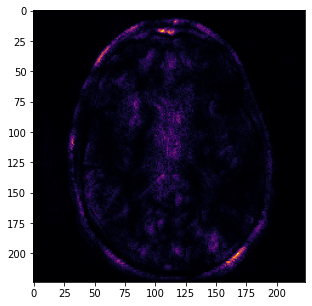

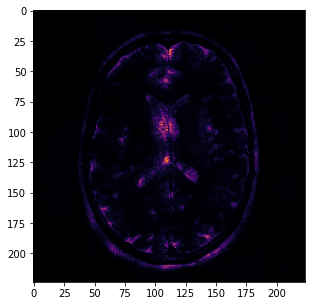

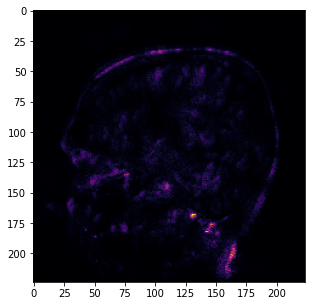

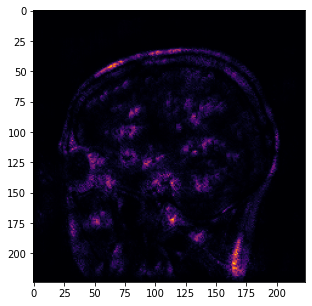

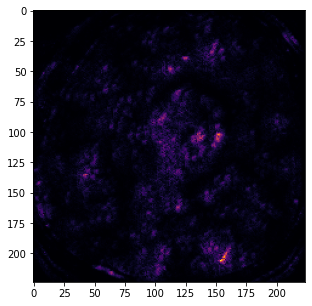

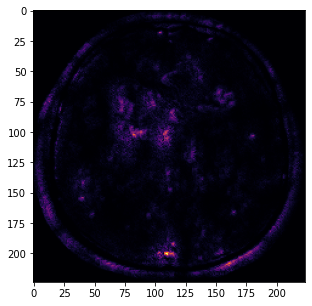

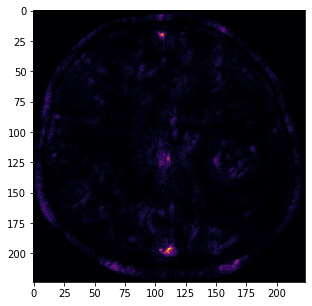

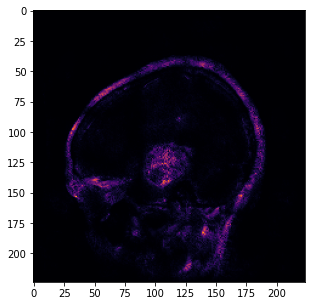

In [ ]:
gap_att_h1,gap_plot_h1 = ig_binary.plot(image=gap_img_h1/255., baseline=baseline, target_class_idx=gap_pred_h1,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_h2, gap_plot_h2 = ig_binary.plot(image=gap_img_h2/255., baseline=baseline, target_class_idx=gap_pred_h2,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_h3, gap_plot_h3 = ig_binary.plot(image=gap_img_h3/255., baseline=baseline, target_class_idx=gap_pred_h3,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_h4, gap_plot_h4 = ig_binary.plot(image=gap_img_h4/255., baseline=baseline, target_class_idx=gap_pred_h3,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_t1, gap_plot_t1 = ig_binary.plot(image=gap_img_t1/255., baseline=baseline, target_class_idx=gap_pred_t1,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_t2, gap_plot_t2 = ig_binary.plot(image=gap_img_t2/255., baseline=baseline, target_class_idx=gap_pred_t2,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_t3, gap_plot_t3 = ig_binary.plot(image=gap_img_t3/255., baseline=baseline, target_class_idx=gap_pred_t3,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
gap_att_t4, gap_plot_t4 = ig_binary.plot(image=gap_img_t4/255, baseline=baseline, target_class_idx=gap_pred_t4,model=b_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μέθοδος Saliency Maps

In [ ]:
gap_simage_h1 = gap_preprocess.preprocess_saliency(image_h1)
gap_simage_h2 = gap_preprocess.preprocess_saliency(image_h2)
gap_simage_h3 = gap_preprocess.preprocess_saliency(image_h3)
gap_simage_h4 = gap_preprocess.preprocess_saliency(image_h4)
gap_simage_t1 = gap_preprocess.preprocess_saliency(image_t1)
gap_simage_t2 = gap_preprocess.preprocess_saliency(image_t2)
gap_simage_t3 = gap_preprocess.preprocess_saliency(image_t3)
gap_simage_t4 = gap_preprocess.preprocess_saliency(image_t4)

In [ ]:
gap_grads_h1 = saliency.saliency_preproccess(gap_simage_h1, b_gap_model)
gap_grads_h2 =  saliency.saliency_preproccess(gap_simage_h2, b_gap_model)
gap_grads_h3 =  saliency.saliency_preproccess(gap_simage_h3, b_gap_model)
gap_grads_h4 =  saliency.saliency_preproccess(gap_simage_h4, b_gap_model)
gap_grads_t1 =  saliency.saliency_preproccess(gap_simage_t1, b_gap_model)
gap_grads_t2 =  saliency.saliency_preproccess(gap_simage_t2, b_gap_model)
gap_grads_t3 =  saliency.saliency_preproccess(gap_simage_t3, b_gap_model)
gap_grads_t4 =  saliency.saliency_preproccess(gap_simage_t4, b_gap_model)

In [ ]:
gap_grad_eval_h1 = saliency.make_saliency(gap_grads_h1)
gap_grad_eval_h2 = saliency.make_saliency(gap_grads_h2)
gap_grad_eval_h3 = saliency.make_saliency(gap_grads_h3)
gap_grad_eval_h4 = saliency.make_saliency(gap_grads_h4)
gap_grad_eval_t1 = saliency.make_saliency(gap_grads_t1)
gap_grad_eval_t2 = saliency.make_saliency(gap_grads_t2)
gap_grad_eval_t3 = saliency.make_saliency(gap_grads_t3)
gap_grad_eval_t4 = saliency.make_saliency(gap_grads_t4)

Μέθοδος Smoothgrad

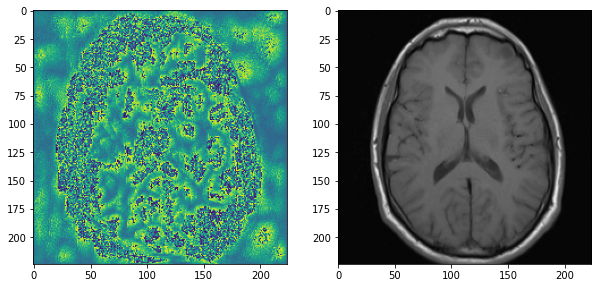

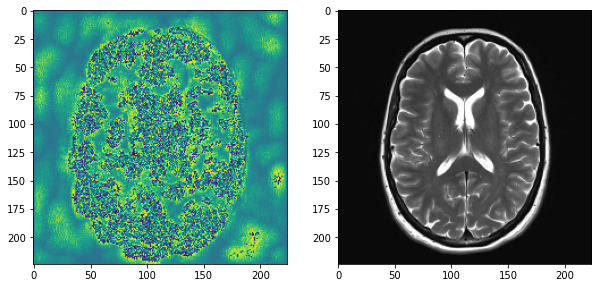

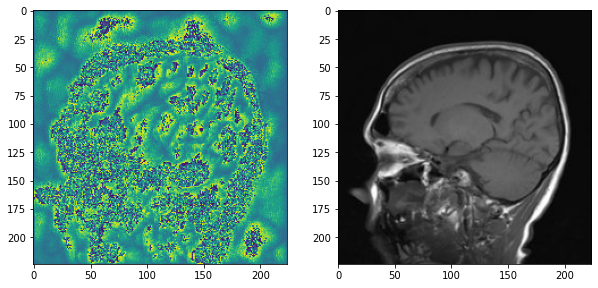

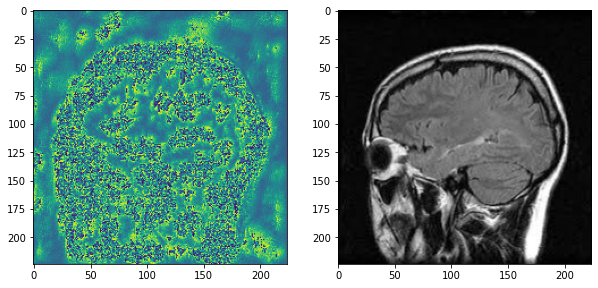

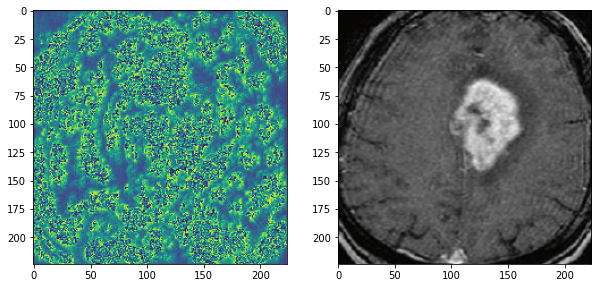

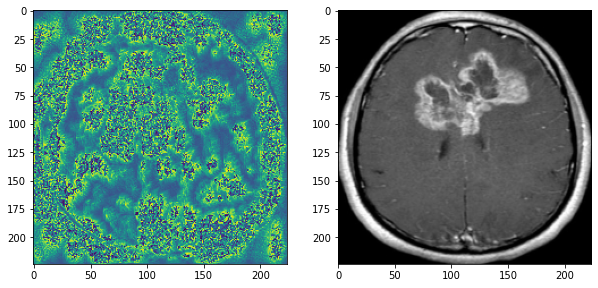

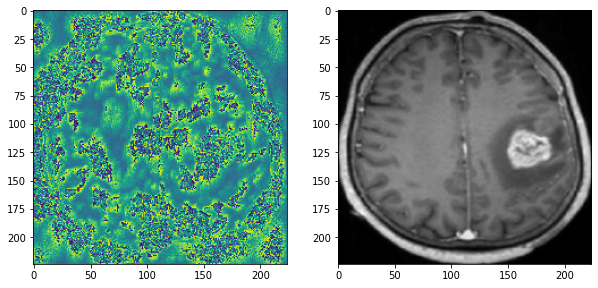

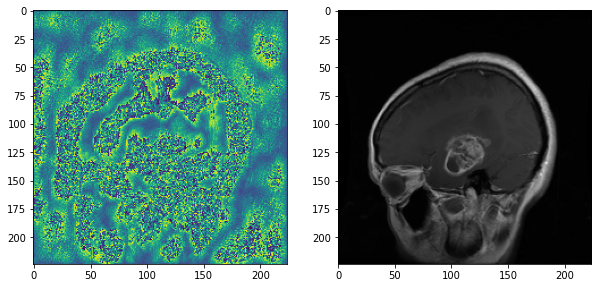

In [ ]:
gap_grid_h1 = smoothgrad.smoothgrad(image_h1, 0, b_gap_model, 5)
gap_grid_h2 = smoothgrad.smoothgrad(image_h2, 0, b_gap_model, 5)
gap_grid_h3 = smoothgrad.smoothgrad(image_h3, 0, b_gap_model, 5)
gap_grid_h4 = smoothgrad.smoothgrad(image_h4, 0, b_gap_model, 5)
gap_grid_t1 = smoothgrad.smoothgrad(image_t1, 1, b_gap_model, 5)
gap_grid_t2 = smoothgrad.smoothgrad(image_t2, 1, b_gap_model, 5)
gap_grid_t3 = smoothgrad.smoothgrad(image_t3, 1, b_gap_model, 5)
gap_grid_t4 = smoothgrad.smoothgrad(image_t4, 1, b_gap_model, 5)


Μέθοδος LIME

In [ ]:
gap_top_features_h1, gap_num_superpixels_h1, gap_superpixels_h1,img_h1 = lime.lime(image_h1,b_gap_model)
gap_top_features_h2, gap_num_superpixels_h2, gap_superpixels_h2,img_h2 = lime.lime(image_h2,b_gap_model)
gap_top_features_h3, gap_num_superpixels_h3, gap_superpixels_h3,img_h3 = lime.lime(image_h3,b_gap_model)
gap_top_features_h4, gap_num_superpixels_h4, gap_superpixels_h4,img_h4 = lime.lime(image_h4,b_gap_model)
gap_top_features_t1, gap_num_superpixels_t1, gap_superpixels_t1,img_t1 = lime.lime(image_t1,b_gap_model)
gap_top_features_t2, gap_num_superpixels_t2, gap_superpixels_t2,img_t2 = lime.lime(image_t2,b_gap_model)
gap_top_features_t3, gap_num_superpixels_t3, gap_superpixels_t3,img_t3 = lime.lime(image_t3,b_gap_model)
gap_top_features_t4, gap_num_superpixels_t4, gap_superpixels_t4,img_t4 = lime.lime(image_t4,b_gap_model)


Αναπαράσταση αποτελεσμάτων για το 1ο μοντέλο

(0.0, 1.0, 0.0, 1.0)

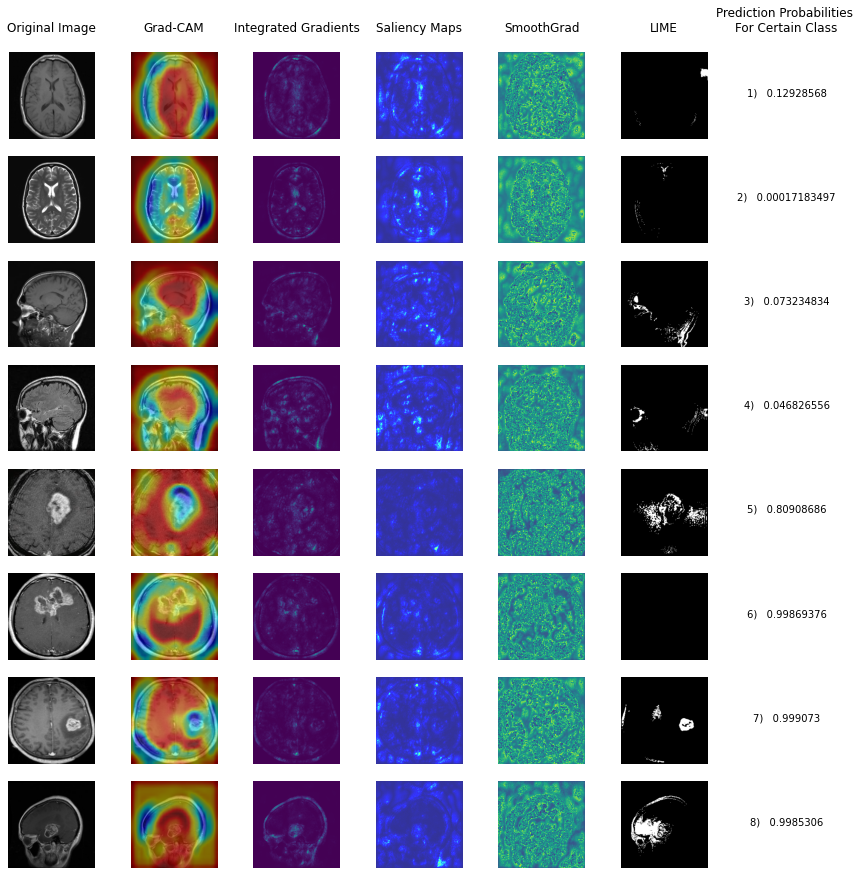

In [ ]:
fig, ax = plt.subplots(8,7,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_h1)
ax[0,0].axis('off')
ax[1,0].imshow(image_h2)
ax[1,0].axis('off')
ax[2,0].imshow(image_h3)
ax[2,0].axis('off')
ax[3,0].imshow(image_h4)
ax[3,0].axis('off')
ax[4,0].imshow(image_t1)
ax[4,0].axis('off')
ax[5,0].imshow(image_t2)
ax[5,0].axis('off')
ax[6,0].imshow(image_t3)
ax[6,0].axis('off')
ax[7,0].imshow(image_t4)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(gap_output_h1)
ax[0,1].axis('off')
ax[1,1].imshow(gap_output_h2)
ax[1,1].axis('off')
ax[2,1].imshow(gap_output_h3)
ax[2,1].axis('off')
ax[3,1].imshow(gap_output_h4)
ax[3,1].axis('off')
ax[4,1].imshow(gap_output_t1)
ax[4,1].axis('off')
ax[5,1].imshow(gap_output_t2)
ax[5,1].axis('off')
ax[6,1].imshow(gap_output_t3)
ax[6,1].axis('off')
ax[7,1].imshow(gap_output_t4)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(gap_plot_h1)
ax[0,2].axis('off')
ax[1,2].imshow(gap_plot_h2)
ax[1,2].axis('off')
ax[2,2].imshow(gap_plot_h3)
ax[2,2].axis('off')
ax[3,2].imshow(gap_plot_h4)
ax[3,2].axis('off')
ax[4,2].imshow(gap_plot_t1)
ax[4,2].axis('off')
ax[5,2].imshow(gap_plot_t2)
ax[5,2].axis('off')
ax[6,2].imshow(gap_plot_t3)
ax[6,2].axis('off')
ax[7,2].imshow(gap_plot_t4)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(gap_grad_eval_h1,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(gap_grad_eval_h2,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(gap_grad_eval_h3,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(gap_grad_eval_h4,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(gap_grad_eval_t1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(gap_grad_eval_t2,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(gap_grad_eval_t3,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(gap_grad_eval_t4,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(gap_grid_h1)
ax[0,4].axis('off')
ax[1,4].imshow(gap_grid_h2)
ax[1,4].axis('off')
ax[2,4].imshow(gap_grid_h3)
ax[2,4].axis('off')
ax[3,4].imshow(gap_grid_h4)
ax[3,4].axis('off')
ax[4,4].imshow(gap_grid_t1)
ax[4,4].axis('off')
ax[5,4].imshow(gap_grid_t2)
ax[5,4].axis('off')
ax[6,4].imshow(gap_grid_t3)
ax[6,4].axis('off')
ax[7,4].imshow(gap_grid_t4)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(gap_num_superpixels_h1) 
mask[gap_top_features_h1]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(gap_img_h1/2+0.5,mask,gap_superpixels_h1))
ax[0,5].axis('off')
mask = np.zeros(gap_num_superpixels_h2) 
mask[gap_top_features_h2]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(gap_img_h2/2+0.5,mask,gap_superpixels_h2))
ax[1,5].axis('off')
mask = np.zeros(gap_num_superpixels_h3) 
mask[gap_top_features_h3]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(gap_img_h3/2+0.5,mask,gap_superpixels_h3))
ax[2,5].axis('off')
mask = np.zeros(gap_num_superpixels_h4) 
mask[gap_top_features_h4]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(gap_img_h4/2+0.5,mask,gap_superpixels_h4))
ax[3,5].axis('off')
mask = np.zeros(gap_num_superpixels_t1) 
mask[gap_top_features_t1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(gap_img_t1/2+0.5,mask,gap_superpixels_t1))
ax[4,5].axis('off')
# amask = np.zeros(gap_num_superpixels_t2) 
# mask[gap_top_features_t2]= True #Activate top superpixels
ax[5,5].imshow(baseline)
ax[5,5].axis('off')
mask = np.zeros(gap_num_superpixels_t3) 
mask[gap_top_features_t3]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(gap_img_t3/2+0.5,mask,gap_superpixels_t3))
ax[6,5].axis('off')
mask = np.zeros(gap_num_superpixels_t4) 
mask[gap_top_features_t4]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(gap_img_t4/2+0.5,mask,gap_superpixels_t4))
ax[7,5].axis('off')

ax[0,6].set_title("Prediction Probabilities \nFor Certain Class\n")
ax[0,6].text(0.5, 0.5, str("1)   ")+ str(gap_pred_h1[0][0]), horizontalalignment='center');
ax[0,6].axis('off')
ax[1,6].text(0.5, 0.5,  str("2)   ")+ str(gap_pred_h2[0][0]), horizontalalignment='center');
ax[1,6].axis('off')
ax[2,6].text(0.5, 0.5,  str("3)   ")+ str(gap_pred_h3[0][0]), horizontalalignment='center');
ax[2,6].axis('off')
ax[3,6].text(0.5, 0.5,  str("4)   ")+ str(gap_pred_h4[0][0]), horizontalalignment='center');
ax[3,6].axis('off')
ax[4,6].text(0.5, 0.5,  str("5)   ")+ str(gap_pred_t1[0][0]), horizontalalignment='center');
ax[4,6].axis('off')
ax[5,6].text(0.5, 0.5,  str("6)   ")+ str(gap_pred_t2[0][0]), horizontalalignment='center');
ax[5,6].axis('off')
ax[6,6].text(0.5, 0.5,  str("7)   ")+ str(gap_pred_t3[0][0]), horizontalalignment='center');
ax[6,6].axis('off')
ax[7,6].text(0.5, 0.5,  str("8)   ")+ str(gap_pred_t4[0][0]), horizontalalignment='center');
ax[7,6].axis('off')

2ο μοντέλο - CNN νε 1x1 Convolutions

In [ ]:
no_gap_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/Binary_Νο_GAP.h5')

Προεπεξεργασία και πρόβλεψη για τις εικόνες

In [ ]:
nogap_im_h1 = gap_preprocess.gradcam_preprocess(image_h1)
nogap_im_h2 = gap_preprocess.gradcam_preprocess(image_h2)
nogap_im_h3 = gap_preprocess.gradcam_preprocess(image_h3)
nogap_im_h4 = gap_preprocess.gradcam_preprocess(image_h4)
nogap_im_t1 = gap_preprocess.gradcam_preprocess(image_t1)
nogap_im_t2 = gap_preprocess.gradcam_preprocess(image_t2)
nogap_im_t3 = gap_preprocess.gradcam_preprocess(image_t3)
nogap_im_t4 = gap_preprocess.gradcam_preprocess(image_t4)

In [ ]:
nogap_pred_h1 = binary_predict.binary_predict(nogap_im_h1, no_gap_model)
nogap_pred_h2 = binary_predict.binary_predict(nogap_im_h2, no_gap_model)
nogap_pred_h3 = binary_predict.binary_predict(nogap_im_h3, no_gap_model)
nogap_pred_h4 = binary_predict.binary_predict(nogap_im_h4, no_gap_model)
nogap_pred_t1 = binary_predict.binary_predict(nogap_im_t1, no_gap_model)
nogap_pred_t2 = binary_predict.binary_predict(nogap_im_t2, no_gap_model)
nogap_pred_t3 = binary_predict.binary_predict(nogap_im_t3, no_gap_model)
nogap_pred_t4 = binary_predict.binary_predict(nogap_im_t4, no_gap_model)

healthy
healthy
healthy
healthy
 tumor
 tumor
 tumor
 tumor


Μέθοδος Grad-CAM

In [ ]:
nogap_heatmap_h1, nogap_output_h1 = grad_cam.make_gradcam(nogap_pred_h1,nogap_im_h1,image_h1,no_gap_model,'conv2d_11')
nogap_heatmap_h2, nogap_output_h2 = grad_cam.make_gradcam(nogap_pred_h2,nogap_im_h2,image_h2,no_gap_model,'conv2d_11')
nogap_heatmap_h3, nogap_output_h3 = grad_cam.make_gradcam(nogap_pred_h3,nogap_im_h3,image_h3,no_gap_model,'conv2d_11')
nogap_heatmap_h4, nogap_output_h4 = grad_cam.make_gradcam(nogap_pred_h4,nogap_im_h4,image_h4,no_gap_model,'conv2d_11')
nogap_heatmap_t1, nogap_output_t1 = grad_cam.make_gradcam(nogap_pred_t1,nogap_im_t1,image_t1,no_gap_model,'conv2d_11')
nogap_heatmap_t2, nogap_output_t2 = grad_cam.make_gradcam(nogap_pred_t2,nogap_im_t2,image_t2,no_gap_model,'conv2d_11')
nogap_heatmap_t3, nogap_output_t3 = grad_cam.make_gradcam(nogap_pred_t3,nogap_im_t3,image_t3,no_gap_model,'conv2d_11')
nogap_heatmap_t4, nogap_output_t4 = grad_cam.make_gradcam(nogap_pred_t4,nogap_im_t4,image_t4,no_gap_model,'conv2d_11')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος Integrated Gradients

In [ ]:
nogap_img_h1 = gap_preprocess.preprocess_ig(image_h1)
nogap_img_h2= gap_preprocess.preprocess_ig(image_h2)
nogap_img_h3 = gap_preprocess.preprocess_ig(image_h3)
nogap_img_h4 = gap_preprocess.preprocess_ig(image_h4)
nogap_img_t1 = gap_preprocess.preprocess_ig(image_t1)
nogap_img_t2 = gap_preprocess.preprocess_ig(image_t2)
nogap_img_t3 = gap_preprocess.preprocess_ig(image_t3)
nogap_img_t4 = gap_preprocess.preprocess_ig(image_t4)

In [ ]:
nogap_interpolated_images_h1 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_h1, alphas=alphas)
nogap_interpolated_images_h2= ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_h2, alphas=alphas)
nogap_interpolated_images_h3 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_h3, alphas=alphas)
nogap_interpolated_images_h4 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_h4, alphas=alphas)
nogap_interpolated_images_t1 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_t1, alphas=alphas)
nogap_interpolated_images_t2 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_t2, alphas=alphas)
nogap_interpolated_images_t3 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_t3, alphas=alphas)
nogap_interpolated_images_t4 = ig_efficientnet.interpolate_images(baseline=baseline,image=nogap_img_t4, alphas=alphas)

In [ ]:
nogap_path_gradients_h1 = ig_binary.compute_gradients(images=nogap_interpolated_images_h1, target_class_idx=nogap_pred_h1,model=no_gap_model)
nogap_path_gradients_h2 = ig_binary.compute_gradients(images=nogap_interpolated_images_h2, target_class_idx=nogap_pred_h2,model=no_gap_model)
nogap_path_gradients_h3 = ig_binary.compute_gradients(images=nogap_interpolated_images_h3, target_class_idx=nogap_pred_h3,model=no_gap_model)
nogap_path_gradients_h4 = ig_binary.compute_gradients(images=nogap_interpolated_images_h4, target_class_idx=nogap_pred_h4,model=no_gap_model)
nogap_path_gradients_t1 = ig_binary.compute_gradients(images=nogap_interpolated_images_t1, target_class_idx=nogap_pred_t1,model=no_gap_model)
nogap_path_gradients_t2 = ig_binary.compute_gradients(images=nogap_interpolated_images_t2, target_class_idx=nogap_pred_t2,model=no_gap_model)
nogap_path_gradients_t3 = ig_binary.compute_gradients(images=nogap_interpolated_images_t3, target_class_idx=nogap_pred_t3,model=no_gap_model)
nogap_path_gradients_t4 = ig_binary.compute_gradients(images=nogap_interpolated_images_t4, target_class_idx=nogap_pred_t4,model=no_gap_model)

In [ ]:
nogap_ig_h1 = ig_binary.integral_approximation(gradients=nogap_path_gradients_h1)
nogap_ig_h2 = ig_binary.integral_approximation(gradients=nogap_path_gradients_h2)
nogap_ig_h3 = ig_binary.integral_approximation(gradients=nogap_path_gradients_h3)
nogap_ig_h4 = ig_binary.integral_approximation(gradients=nogap_path_gradients_h4)
nogap_ig_t1 = ig_binary.integral_approximation(gradients=nogap_path_gradients_t1)
nogap_ig_t2 = ig_binary.integral_approximation(gradients=nogap_path_gradients_t2)
nogap_ig_t3 = ig_binary.integral_approximation(gradients=nogap_path_gradients_t3)
nogap_ig_t4 = ig_binary.integral_approximation(gradients=nogap_path_gradients_t4)

In [ ]:
nogap_mig_attributions_h1 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_h1,target_class_idx=nogap_pred_h1,model=no_gap_model, m_steps=240)
nogap_mig_attributions_h2 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_h2,target_class_idx=nogap_pred_h2,model=no_gap_model, m_steps=240)
nogap_mig_attributions_h3 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_h3,target_class_idx=nogap_pred_h3,model=no_gap_model, m_steps=240)
nogap_mig_attributions_h4 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_h4,target_class_idx=nogap_pred_h4,model=no_gap_model, m_steps=240)
nogap_mig_attributions_t1 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_t1,target_class_idx=nogap_pred_t1,model=no_gap_model, m_steps=240)
nogap_mig_attributions_t2 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_t2,target_class_idx=nogap_pred_t2,model=no_gap_model, m_steps=240)
nogap_mig_attributions_t3 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_t3,target_class_idx=nogap_pred_t3,model=no_gap_model, m_steps=240)
nogap_mig_attributions_t4 = ig_binary.integrated_gradients(baseline=baseline,image=nogap_img_t4,target_class_idx=nogap_pred_t4,model=no_gap_model, m_steps=240)

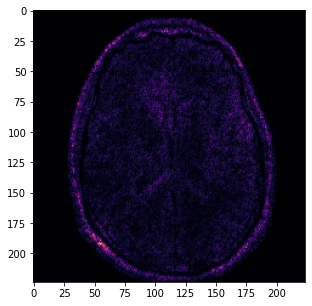

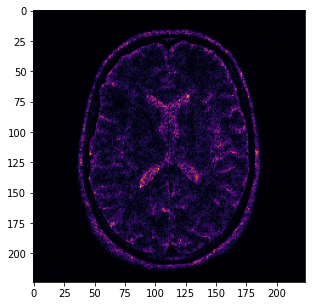

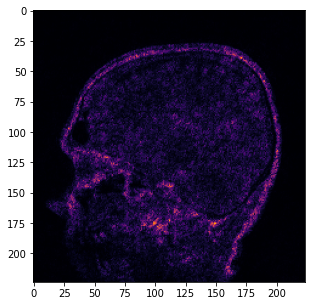

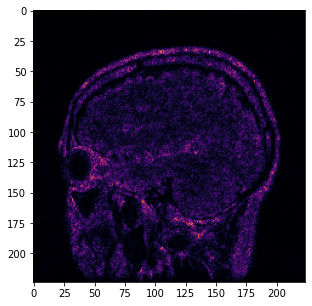

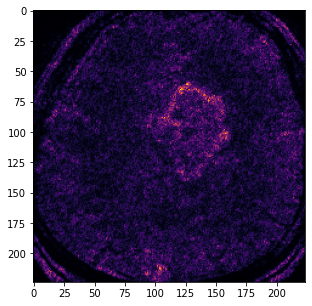

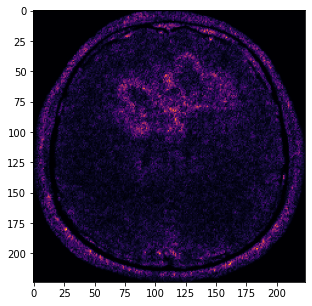

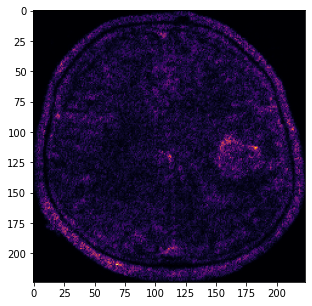

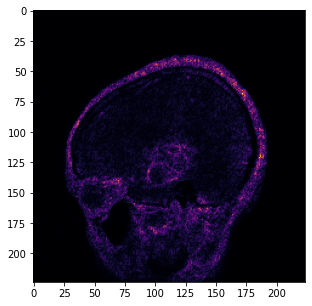

In [ ]:
nogap_att_h1,nogap_plot_h1 = ig_binary.plot(image=nogap_img_h1/255, baseline=baseline, target_class_idx=nogap_pred_h1,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_h2, nogap_plot_h2 = ig_binary.plot(image=nogap_img_h2/255, baseline=baseline, target_class_idx=nogap_pred_h2,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_h3, nogap_plot_h3 = ig_binary.plot(image=nogap_img_h3/255, baseline=baseline, target_class_idx=nogap_pred_h3,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_h4, nogap_plot_h4 = ig_binary.plot(image=nogap_img_h4/255, baseline=baseline, target_class_idx=nogap_pred_h3,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_t1, nogap_plot_t1 = ig_binary.plot(image=nogap_img_t1/255, baseline=baseline, target_class_idx=nogap_pred_t1,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_t2, nogap_plot_t2 = ig_binary.plot(image=nogap_img_t2/255, baseline=baseline, target_class_idx=nogap_pred_t2,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_t3, nogap_plot_t3 = ig_binary.plot(image=nogap_img_t3/255, baseline=baseline, target_class_idx=nogap_pred_t3,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
nogap_att_t4, nogap_plot_t4 = ig_binary.plot(image=nogap_img_t4/255, baseline=baseline, target_class_idx=nogap_pred_t4,model=no_gap_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μέθοδος Saliency Maps

In [ ]:
nogap_simage_h1 = gap_preprocess.preprocess_saliency(image_h1)
nogap_simage_h2 = gap_preprocess.preprocess_saliency(image_h2)
nogap_simage_h3 = gap_preprocess.preprocess_saliency(image_h3)
nogap_simage_h4 = gap_preprocess.preprocess_saliency(image_h4)
nogap_simage_t1 = gap_preprocess.preprocess_saliency(image_t1)
nogap_simage_t2 = gap_preprocess.preprocess_saliency(image_t2)
nogap_simage_t3 = gap_preprocess.preprocess_saliency(image_t3)
nogap_simage_t4 = gap_preprocess.preprocess_saliency(image_t4)

In [ ]:
nogap_grads_h1 = saliency.saliency_preproccess(nogap_simage_h1, no_gap_model)
nogap_grads_h2 =  saliency.saliency_preproccess(nogap_simage_h2, no_gap_model)
nogap_grads_h3 =  saliency.saliency_preproccess(nogap_simage_h3, no_gap_model)
nogap_grads_h4 =  saliency.saliency_preproccess(nogap_simage_h4, no_gap_model)
nogap_grads_t1 =  saliency.saliency_preproccess(nogap_simage_t1, no_gap_model)
nogap_grads_t2 =  saliency.saliency_preproccess(nogap_simage_t2, no_gap_model)
nogap_grads_t3 =  saliency.saliency_preproccess(nogap_simage_t3, no_gap_model)
nogap_grads_t4 =  saliency.saliency_preproccess(nogap_simage_t4, no_gap_model)

In [ ]:
nogap_grad_eval_h1 = saliency.make_saliency(nogap_grads_h1)
nogap_grad_eval_h2 = saliency.make_saliency(nogap_grads_h2)
nogap_grad_eval_h3 = saliency.make_saliency(nogap_grads_h3)
nogap_grad_eval_h4 = saliency.make_saliency(nogap_grads_h4)
nogap_grad_eval_t1 = saliency.make_saliency(nogap_grads_t1)
nogap_grad_eval_t2 = saliency.make_saliency(nogap_grads_t2)
nogap_grad_eval_t3 = saliency.make_saliency(nogap_grads_t3)
nogap_grad_eval_t4 = saliency.make_saliency(nogap_grads_t4)

Μέθοδος Smoothgrad

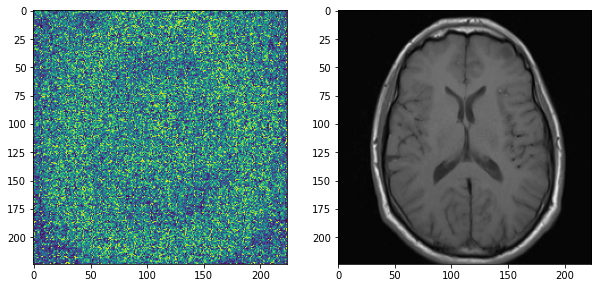

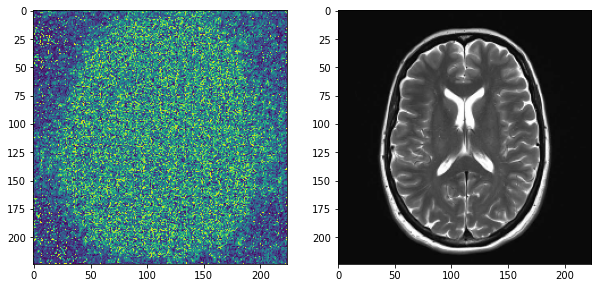

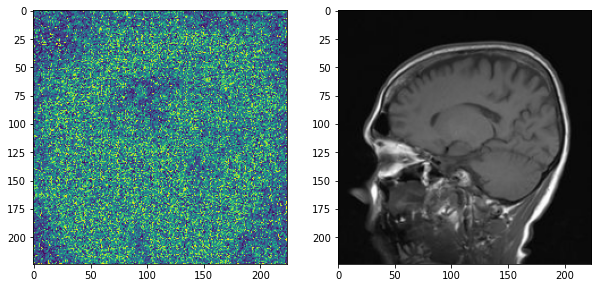

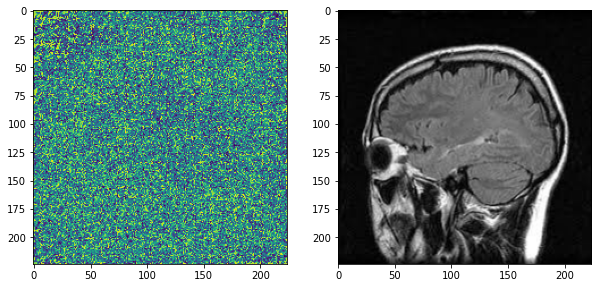

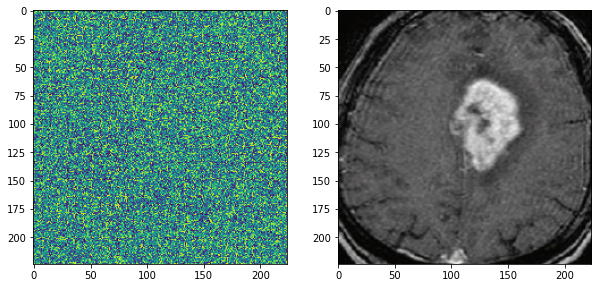

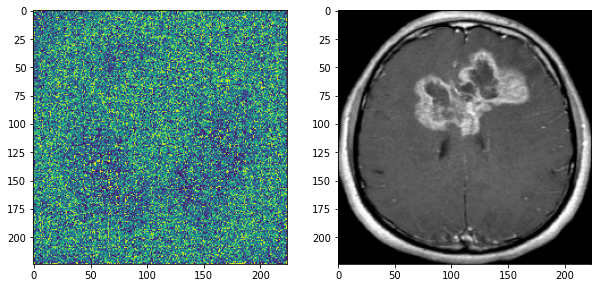

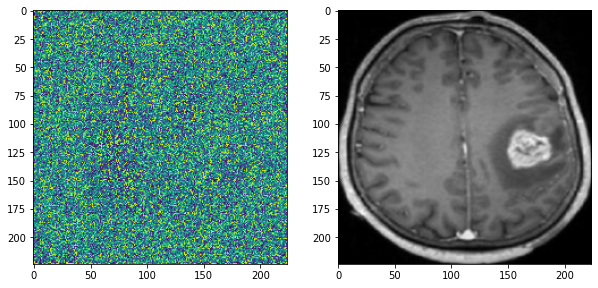

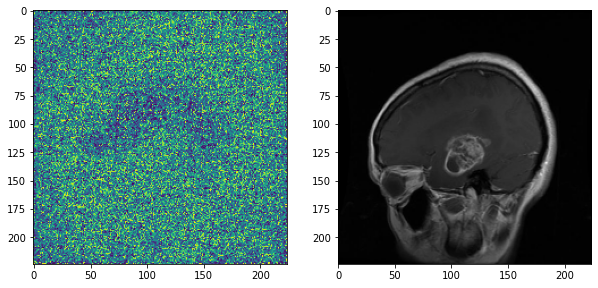

In [ ]:
nogap_grid_h1 = smoothgrad.smoothgrad(image_h1, 0, no_gap_model, 1)
nogap_grid_h2 = smoothgrad.smoothgrad(image_h2, 0, no_gap_model, 1)
nogap_grid_h3 = smoothgrad.smoothgrad(image_h3, 0, no_gap_model, 1)
nogap_grid_h4 = smoothgrad.smoothgrad(image_h4, 0, no_gap_model, 0.5)
nogap_grid_t1 = smoothgrad.smoothgrad(image_t1, 1, no_gap_model, 1)
nogap_grid_t2 = smoothgrad.smoothgrad(image_t2, 1, no_gap_model, 1)
nogap_grid_t3 = smoothgrad.smoothgrad(image_t3, 1, no_gap_model, 1)
nogap_grid_t4 = smoothgrad.smoothgrad(image_t4, 1, no_gap_model, 1)


Μέθοδος LIME

In [ ]:
nogap_top_features_h1, nogap_num_superpixels_h1, nogap_superpixels_h1,img_h1 = lime.lime(image_h1,no_gap_model)
nogap_top_features_h2, nogap_num_superpixels_h2, nogap_superpixels_h2,img_h2 = lime.lime(image_h2,no_gap_model)
nogap_top_features_h3, nogap_num_superpixels_h3, nogap_superpixels_h3,img_h3 = lime.lime(image_h3,no_gap_model)
nogap_top_features_h4, nogap_num_superpixels_h4, nogap_superpixels_h4,img_h4 = lime.lime(image_h4,no_gap_model)
nogap_top_features_t1, nogap_num_superpixels_t1, nogap_superpixels_t1,img_t1 = lime.lime(image_t1,no_gap_model)
nogap_top_features_t2, nogap_num_superpixels_t2, nogap_superpixels_t2,img_t2 = lime.lime(image_t2,no_gap_model)
nogap_top_features_t3, nogap_num_superpixels_t3, nogap_superpixels_t3,img_t3 = lime.lime(image_t3,no_gap_model)
nogap_top_features_t4, nogap_num_superpixels_t4, nogap_superpixels_t4,img_t4 = lime.lime(image_t4,no_gap_model)


Αναπαράσταση αποτελεσμάτων για το 2ο custom μοντέλο

(0.0, 1.0, 0.0, 1.0)

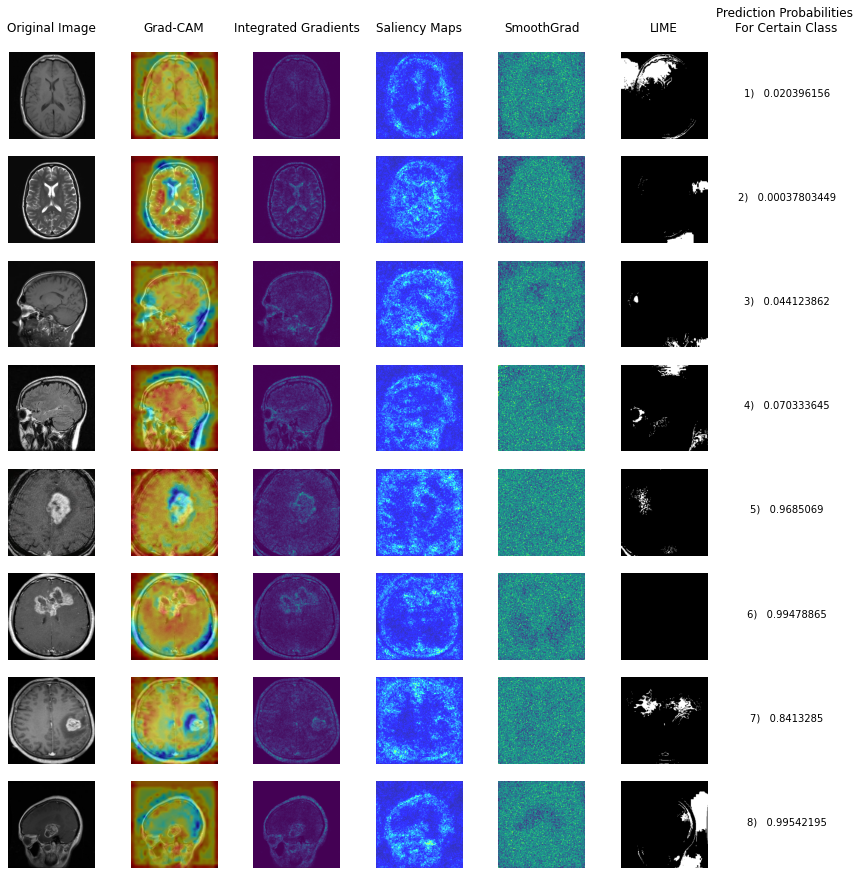

In [ ]:
fig, ax = plt.subplots(8,7,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_h1)
ax[0,0].axis('off')
ax[1,0].imshow(image_h2)
ax[1,0].axis('off')
ax[2,0].imshow(image_h3)
ax[2,0].axis('off')
ax[3,0].imshow(image_h4)
ax[3,0].axis('off')
ax[4,0].imshow(image_t1)
ax[4,0].axis('off')
ax[5,0].imshow(image_t2)
ax[5,0].axis('off')
ax[6,0].imshow(image_t3)
ax[6,0].axis('off')
ax[7,0].imshow(image_t4)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(nogap_output_h1)
ax[0,1].axis('off')
ax[1,1].imshow(nogap_output_h2)
ax[1,1].axis('off')
ax[2,1].imshow(nogap_output_h3)
ax[2,1].axis('off')
ax[3,1].imshow(nogap_output_h4)
ax[3,1].axis('off')
ax[4,1].imshow(nogap_output_t1)
ax[4,1].axis('off')
ax[5,1].imshow(nogap_output_t2)
ax[5,1].axis('off')
ax[6,1].imshow(nogap_output_t3)
ax[6,1].axis('off')
ax[7,1].imshow(nogap_output_t4)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(nogap_plot_h1)
ax[0,2].axis('off')
ax[1,2].imshow(nogap_plot_h2)
ax[1,2].axis('off')
ax[2,2].imshow(nogap_plot_h3)
ax[2,2].axis('off')
ax[3,2].imshow(nogap_plot_h4)
ax[3,2].axis('off')
ax[4,2].imshow(nogap_plot_t1)
ax[4,2].axis('off')
ax[5,2].imshow(nogap_plot_t2)
ax[5,2].axis('off')
ax[6,2].imshow(nogap_plot_t3)
ax[6,2].axis('off')
ax[7,2].imshow(nogap_plot_t4)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(nogap_grad_eval_h1,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(nogap_grad_eval_h2,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(nogap_grad_eval_h3,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(nogap_grad_eval_h4,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(nogap_grad_eval_t1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(nogap_grad_eval_t2,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(nogap_grad_eval_t3,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(nogap_grad_eval_t4,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(nogap_grid_h1)
ax[0,4].axis('off')
ax[1,4].imshow(nogap_grid_h2)
ax[1,4].axis('off')
ax[2,4].imshow(nogap_grid_h3)
ax[2,4].axis('off')
ax[3,4].imshow(nogap_grid_h4)
ax[3,4].axis('off')
ax[4,4].imshow(nogap_grid_t1)
ax[4,4].axis('off')
ax[5,4].imshow(nogap_grid_t2)
ax[5,4].axis('off')
ax[6,4].imshow(nogap_grid_t3)
ax[6,4].axis('off')
ax[7,4].imshow(nogap_grid_t4)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(nogap_num_superpixels_h1) 
mask[nogap_top_features_h1]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(nogap_img_h1/2+0.5,mask,nogap_superpixels_h1))
ax[0,5].axis('off')
mask = np.zeros(nogap_num_superpixels_h2) 
mask[nogap_top_features_h2]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(nogap_img_h2/2+0.5,mask,nogap_superpixels_h2))
ax[1,5].axis('off')
mask = np.zeros(nogap_num_superpixels_h3) 
mask[nogap_top_features_h3]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(nogap_img_h3/2+0.5,mask,nogap_superpixels_h3))
ax[2,5].axis('off')
mask = np.zeros(nogap_num_superpixels_h4) 
mask[nogap_top_features_h4]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(nogap_img_h4/2+0.5,mask,nogap_superpixels_h4))
ax[3,5].axis('off')
mask = np.zeros(nogap_num_superpixels_t1) 
mask[nogap_top_features_t1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(nogap_img_t1/2+0.5,mask,nogap_superpixels_t1))
ax[4,5].axis('off')
# amask = np.zeros(nogap_num_superpixels_t1) 
# mask[nogap_top_features_t1]= True #Activate top superpixels
ax[5,5].imshow(baseline)
ax[5,5].axis('off')
mask = np.zeros(nogap_num_superpixels_t3) 
mask[nogap_top_features_t3]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(nogap_img_t3/2+0.5,mask,nogap_superpixels_t3))
ax[6,5].axis('off')
mask = np.zeros(nogap_num_superpixels_t4) 
mask[nogap_top_features_t4]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(nogap_img_t4/2+0.5,mask,nogap_superpixels_t4))
ax[7,5].axis('off')

ax[0,6].set_title("Prediction Probabilities \nFor Certain Class\n")
ax[0,6].text(0.5, 0.5, str("1)   ")+ str(nogap_pred_h1[0][0]), horizontalalignment='center');
ax[0,6].axis('off')
ax[1,6].text(0.5, 0.5,  str("2)   ")+ str(nogap_pred_h2[0][0]), horizontalalignment='center');
ax[1,6].axis('off')
ax[2,6].text(0.5, 0.5,  str("3)   ")+ str(nogap_pred_h3[0][0]), horizontalalignment='center');
ax[2,6].axis('off')
ax[3,6].text(0.5, 0.5,  str("4)   ")+ str(nogap_pred_h4[0][0]), horizontalalignment='center');
ax[3,6].axis('off')
ax[4,6].text(0.5, 0.5,  str("5)   ")+ str(nogap_pred_t1[0][0]), horizontalalignment='center');
ax[4,6].axis('off')
ax[5,6].text(0.5, 0.5,  str("6)   ")+ str(nogap_pred_t2[0][0]), horizontalalignment='center');
ax[5,6].axis('off')
ax[6,6].text(0.5, 0.5,  str("7)   ")+ str(nogap_pred_t3[0][0]), horizontalalignment='center');
ax[6,6].axis('off')
ax[7,6].text(0.5, 0.5,  str("8)   ")+ str(nogap_pred_t4[0][0]), horizontalalignment='center');
ax[7,6].axis('off')

3o μοντέλο - EfficientNetB0

In [ ]:
b_eff_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/Binary_EfficientNetB0.h5')

Βοηθητικό μοντέλο

In [ ]:
y = b_eff_model.get_layer('dense_final').output
y = tf.math.scalar_mul(0.2, y)
y = layers.Activation("sigmoid")(y)

b_eff_y_model = Model(inputs=b_eff_model.input, outputs=y)

Πρόβλεψη για την εικόνα

In [ ]:
im_h1 = effnet_preprocess.gradcam_preprocess(image_h1)
im_h2 = effnet_preprocess.gradcam_preprocess(image_h2)
im_h3 = effnet_preprocess.gradcam_preprocess(image_h3)
im_h4 = effnet_preprocess.gradcam_preprocess(image_h4)
im_t1 = effnet_preprocess.gradcam_preprocess(image_t1)
im_t2 = effnet_preprocess.gradcam_preprocess(image_t2)
im_t3 = effnet_preprocess.gradcam_preprocess(image_t3)
im_t4 = effnet_preprocess.gradcam_preprocess(image_t4)

In [ ]:
pred_h1 = binary_predict.binary_predict(im_h1, b_eff_y_model)
pred_h2 = binary_predict.binary_predict(im_h2, b_eff_y_model)
pred_h3 = binary_predict.binary_predict(im_h3, b_eff_y_model)
pred_h4 = binary_predict.binary_predict(im_h4, b_eff_y_model)
pred_t1 = binary_predict.binary_predict(im_t1, b_eff_y_model)
pred_t2 = binary_predict.binary_predict(im_t2, b_eff_y_model)
pred_t3 = binary_predict.binary_predict(im_t3, b_eff_y_model)
pred_t4 = binary_predict.binary_predict(im_t4, b_eff_y_model)

healthy
healthy
healthy
healthy
 tumor
 tumor
 tumor
 tumor


In [ ]:
str(pred_h1[0][0])

'0.0479815'

Μέθοδος Grad-CAM

In [ ]:
heatmap_h1, output_h1 = grad_cam.make_gradcam(pred_h1,im_h1,image_h1,b_eff_y_model,'top_activation')
heatmap_h2, output_h2 = grad_cam.make_gradcam(pred_h2,im_h2,image_h2,b_eff_y_model,'top_activation')
heatmap_h3, output_h3 = grad_cam.make_gradcam(pred_h3,im_h3,image_h3,b_eff_y_model,'top_activation')
heatmap_h4, output_h4 = grad_cam.make_gradcam(pred_h4,im_h4,image_h4,b_eff_y_model,'top_activation')
heatmap_t1, output_t1 = grad_cam.make_gradcam(pred_t1,im_t1,image_t1,b_eff_y_model,'top_activation')
heatmap_t2, output_t2 = grad_cam.make_gradcam(pred_t2,im_t2,image_t2,b_eff_y_model,'top_activation')
heatmap_t3, output_t3 = grad_cam.make_gradcam(pred_t3,im_t3,image_t3,b_eff_y_model,'top_activation')
heatmap_t4, output_t4 = grad_cam.make_gradcam(pred_t4,im_t4,image_t4,b_eff_y_model,'top_activation')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος Integrated Gradients

In [ ]:
img_h1 = effnet_preprocess.preprocess_ig(image_h1)
img_h2= effnet_preprocess.preprocess_ig(image_h2)
img_h3 = effnet_preprocess.preprocess_ig(image_h3)
img_h4 = effnet_preprocess.preprocess_ig(image_h4)
img_t1 = effnet_preprocess.preprocess_ig(image_t1)
img_t2 = effnet_preprocess.preprocess_ig(image_t2)
img_t3 = effnet_preprocess.preprocess_ig(image_t3)
img_t4 = effnet_preprocess.preprocess_ig(image_t4)

In [ ]:
interpolated_images_h1 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_h1, alphas=alphas)
interpolated_images_h2= ig_efficientnet.interpolate_images(baseline=baseline,image=img_h2, alphas=alphas)
interpolated_images_h3 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_h3, alphas=alphas)
interpolated_images_h4 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_h4, alphas=alphas)
interpolated_images_t1 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_t1, alphas=alphas)
interpolated_images_t2 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_t2, alphas=alphas)
interpolated_images_t3 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_t3, alphas=alphas)
interpolated_images_t4 = ig_efficientnet.interpolate_images(baseline=baseline,image=img_t4, alphas=alphas)

In [ ]:
path_gradients_h1 = ig_binary.compute_gradients(images=interpolated_images_h1, target_class_idx=pred_h1,model=b_eff_y_model)
path_gradients_h2 = ig_binary.compute_gradients(images=interpolated_images_h2, target_class_idx=pred_h2,model=b_eff_y_model)
path_gradients_h3 = ig_binary.compute_gradients(images=interpolated_images_h3, target_class_idx=pred_h3,model=b_eff_y_model)
path_gradients_h4 = ig_binary.compute_gradients(images=interpolated_images_h4, target_class_idx=pred_h4,model=b_eff_y_model)
path_gradients_t1 = ig_binary.compute_gradients(images=interpolated_images_t1, target_class_idx=pred_t1,model=b_eff_y_model)
path_gradients_t2 = ig_binary.compute_gradients(images=interpolated_images_t2, target_class_idx=pred_t2,model=b_eff_y_model)
path_gradients_t3 = ig_binary.compute_gradients(images=interpolated_images_t3, target_class_idx=pred_t3,model=b_eff_y_model)
path_gradients_t4 = ig_binary.compute_gradients(images=interpolated_images_t4, target_class_idx=pred_t4,model=b_eff_y_model)

In [ ]:
ig_h1 = ig_binary.integral_approximation(gradients=path_gradients_h1)
ig_h2 = ig_binary.integral_approximation(gradients=path_gradients_h2)
ig_h3 = ig_binary.integral_approximation(gradients=path_gradients_h3)
ig_h4 = ig_binary.integral_approximation(gradients=path_gradients_h4)
ig_t1 = ig_binary.integral_approximation(gradients=path_gradients_t1)
ig_t2 = ig_binary.integral_approximation(gradients=path_gradients_t2)
ig_t3 = ig_binary.integral_approximation(gradients=path_gradients_t3)
ig_t4 = ig_binary.integral_approximation(gradients=path_gradients_t4)

In [ ]:
_mig_attributions_h1 = ig_binary.integrated_gradients(baseline=baseline,image=img_h1,target_class_idx=pred_h1,model=b_eff_y_model, m_steps=240)
_mig_attributions_h2 = ig_binary.integrated_gradients(baseline=baseline,image=img_h2,target_class_idx=pred_h2,model=b_eff_y_model, m_steps=240)
_mig_attributions_h3 = ig_binary.integrated_gradients(baseline=baseline,image=img_h3,target_class_idx=pred_h3,model=b_eff_y_model, m_steps=240)
_mig_attributions_h4 = ig_binary.integrated_gradients(baseline=baseline,image=img_h4,target_class_idx=pred_h4,model=b_eff_y_model, m_steps=240)
_mig_attributions_t1 = ig_binary.integrated_gradients(baseline=baseline,image=img_t1,target_class_idx=pred_t1,model=b_eff_y_model, m_steps=240)
_mig_attributions_t2 = ig_binary.integrated_gradients(baseline=baseline,image=img_t2,target_class_idx=pred_t2,model=b_eff_y_model, m_steps=240)
_mig_attributions_t3 = ig_binary.integrated_gradients(baseline=baseline,image=img_t3,target_class_idx=pred_t3,model=b_eff_y_model, m_steps=240)
_mig_attributions_t4 = ig_binary.integrated_gradients(baseline=baseline,image=img_t4,target_class_idx=pred_t4,model=b_eff_y_model, m_steps=240)

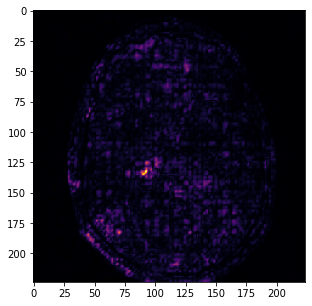

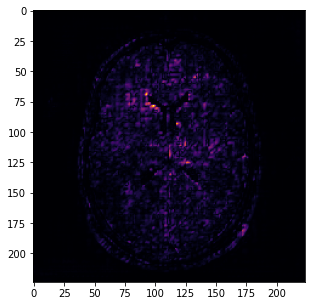

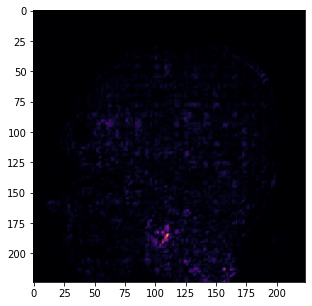

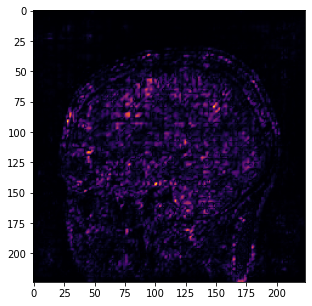

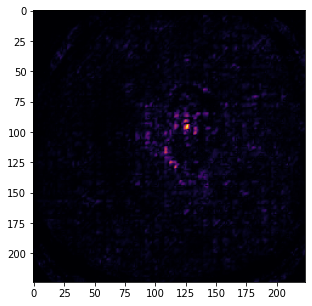

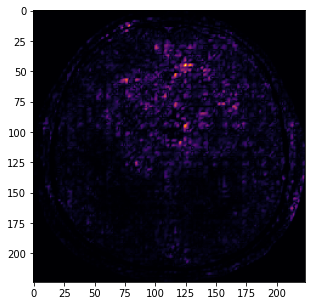

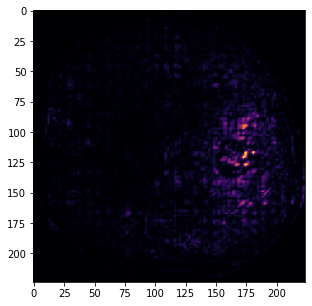

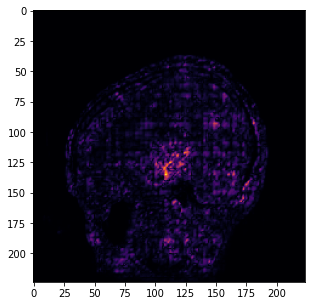

In [ ]:
att_h1, plot_h1 = ig_binary.plot(image=img_h1, baseline=baseline, target_class_idx=pred_h1,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_h2, plot_h2 = ig_binary.plot(image=img_h2, baseline=baseline, target_class_idx=pred_h2,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_h3, plot_h3 = ig_binary.plot(image=img_h3, baseline=baseline, target_class_idx=pred_h3,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_h4, plot_h4 = ig_binary.plot(image=img_h4, baseline=baseline, target_class_idx=pred_h3,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_t1, plot_t1 = ig_binary.plot(image=img_t1, baseline=baseline, target_class_idx=pred_t1,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_t2, plot_t2 = ig_binary.plot(image=img_t2, baseline=baseline, target_class_idx=pred_t2,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_t3, plot_t3 = ig_binary.plot(image=img_t3, baseline=baseline, target_class_idx=pred_t3,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
att_t4, plot_t4 = ig_binary.plot(image=img_t4, baseline=baseline, target_class_idx=pred_t4,model=b_eff_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μέθοδος Saliency Maps

In [ ]:
simage_h1 = effnet_preprocess.preprocess_saliency(image_h1)
simage_h2 = effnet_preprocess.preprocess_saliency(image_h2)
simage_h3 = effnet_preprocess.preprocess_saliency(image_h3)
simage_h4 = effnet_preprocess.preprocess_saliency(image_h4)
simage_t1 = effnet_preprocess.preprocess_saliency(image_t1)
simage_t2 = effnet_preprocess.preprocess_saliency(image_t2)
simage_t3 = effnet_preprocess.preprocess_saliency(image_t3)
simage_t4 = effnet_preprocess.preprocess_saliency(image_t4)

In [ ]:
grads_h1 = saliency.saliency_preproccess(simage_h1, b_eff_y_model)
grads_h2 =  saliency.saliency_preproccess(simage_h2, b_eff_y_model)
grads_h3 =  saliency.saliency_preproccess(simage_h3, b_eff_y_model)
grads_h4 =  saliency.saliency_preproccess(simage_h4, b_eff_y_model)
grads_t1 =  saliency.saliency_preproccess(simage_t1, b_eff_y_model)
grads_t2 =  saliency.saliency_preproccess(simage_t2, b_eff_y_model)
grads_t3 =  saliency.saliency_preproccess(simage_t3, b_eff_y_model)
grads_t4 =  saliency.saliency_preproccess(simage_t4, b_eff_y_model)

In [ ]:
grad_eval_h1 = saliency.make_saliency(grads_h1)
grad_eval_h2 = saliency.make_saliency(grads_h2)
grad_eval_h3 = saliency.make_saliency(grads_h3)
grad_eval_h4 = saliency.make_saliency(grads_h4)
grad_eval_t1 = saliency.make_saliency(grads_t1)
grad_eval_t2 = saliency.make_saliency(grads_t2)
grad_eval_t3 = saliency.make_saliency(grads_t3)
grad_eval_t4 = saliency.make_saliency(grads_t4)

Μέθοδος Smoothgrad

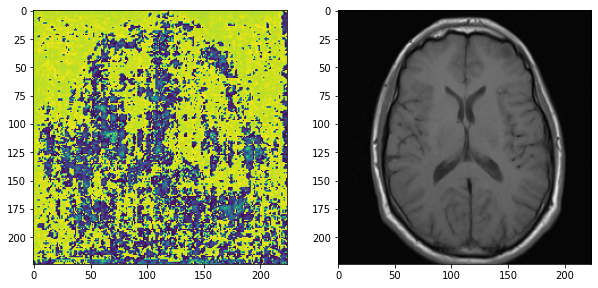

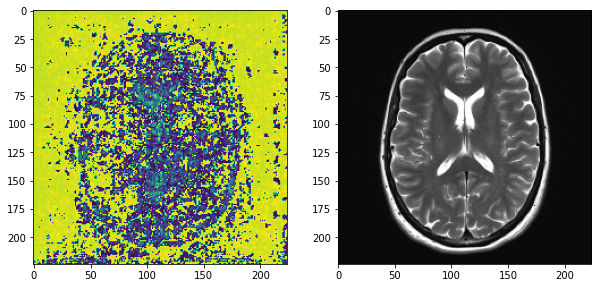

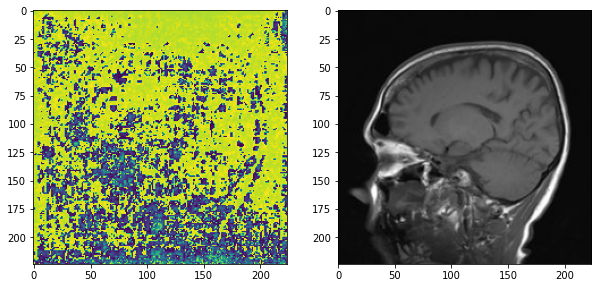

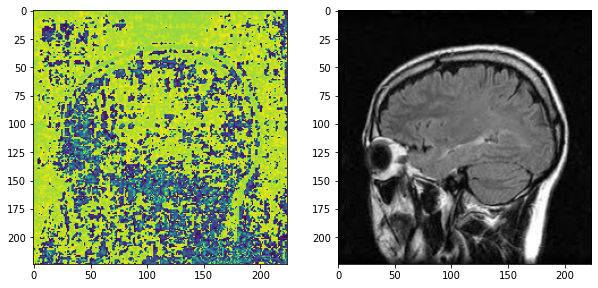

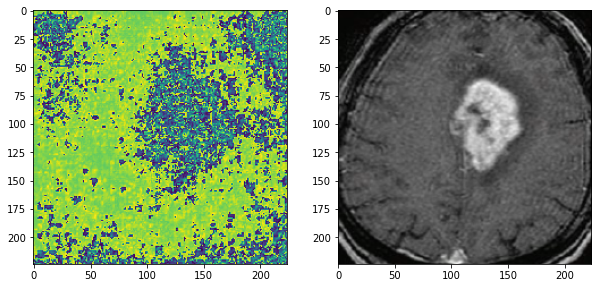

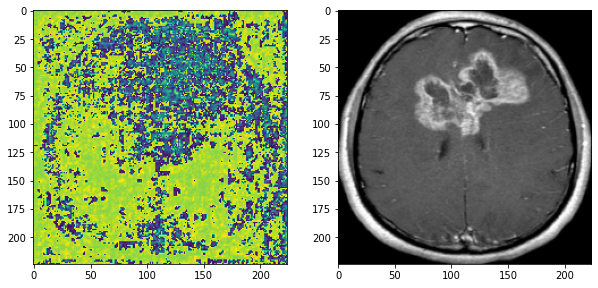

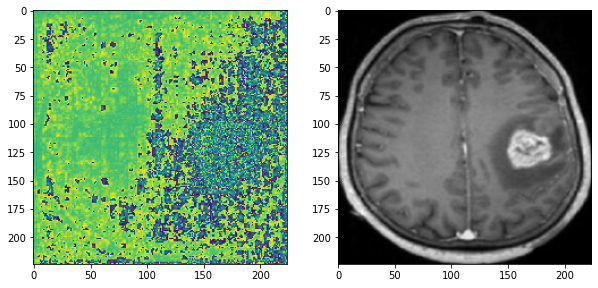

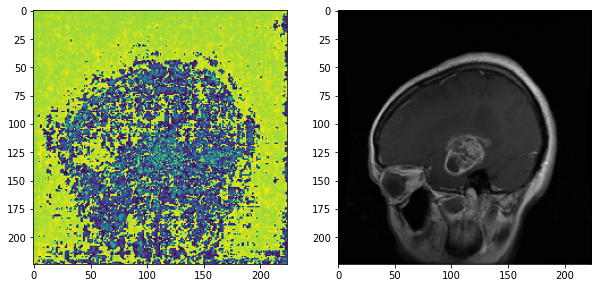

In [ ]:
grid_h1 = smoothgrad.smoothgrad(image_h1, 2, b_eff_y_model, 1)
grid_h2 = smoothgrad.smoothgrad(image_h2, 1, b_eff_y_model, 1)
grid_h3 = smoothgrad.smoothgrad(image_h3, 0, b_eff_y_model, 1)
grid_h4 = smoothgrad.smoothgrad(image_h4, 3, b_eff_y_model, 0.5)
grid_t1 = smoothgrad.smoothgrad(image_t1, 2, b_eff_y_model, 1)
grid_t2 = smoothgrad.smoothgrad(image_t2, 1, b_eff_y_model, 1)
grid_t3 = smoothgrad.smoothgrad(image_t3, 0, b_eff_y_model, 1)
grid_t4 = smoothgrad.smoothgrad(image_t4, 3, b_eff_y_model, 1)


Μέθοδος LIME

In [ ]:
top_features_h1, num_superpixels_h1, superpixels_h1,img_h1 = lime.lime(image_h1,b_eff_y_model)
top_features_h2, num_superpixels_h2, superpixels_h2,img_h2 = lime.lime(image_h2,b_eff_y_model)
top_features_h3, num_superpixels_h3, superpixels_h3,img_h3 = lime.lime(image_h3,b_eff_y_model)
top_features_h4, num_superpixels_h4, superpixels_h4,img_h4 = lime.lime(image_h4,b_eff_y_model)
top_features_t1, num_superpixels_t1, superpixels_t1,img_t1 = lime.lime(image_t1,b_eff_y_model)
top_features_t2, num_superpixels_t2, superpixels_t2,img_t2 = lime.lime(image_t2,b_eff_y_model)
top_features_t3, num_superpixels_t3, superpixels_t3,img_t3 = lime.lime(image_t3,b_eff_y_model)
top_features_t4, num_superpixels_t4, superpixels_t4,img_t4 = lime.lime(image_t4,b_eff_y_model)


Αναπαράσταση των παραδειγμάτων για το EfficientNetB0

(0.0, 1.0, 0.0, 1.0)

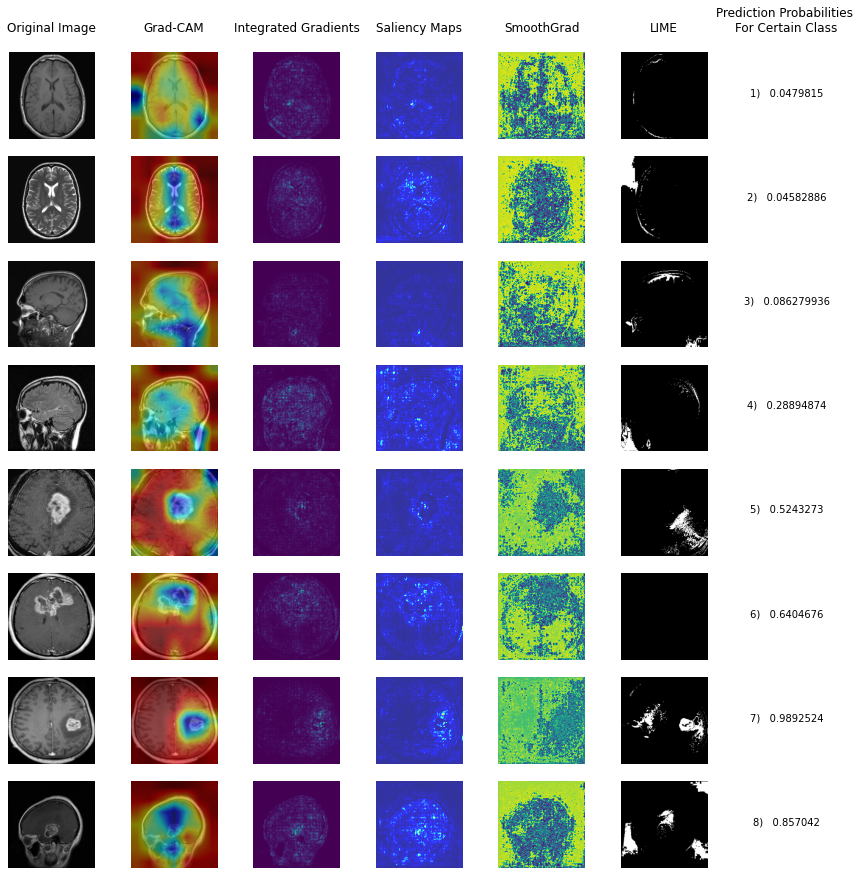

In [ ]:
fig, ax = plt.subplots(8,7,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_h1)
ax[0,0].axis('off')
ax[0,0].set_ylabel("Meningioma")
# ax[0,0].set_title("Meningioma Tumor")
ax[1,0].imshow(image_h2)
ax[1,0].axis('off')
ax[2,0].imshow(image_h3)
ax[2,0].axis('off')
ax[3,0].imshow(image_h4)
ax[3,0].axis('off')
ax[4,0].imshow(image_t1)
ax[4,0].axis('off')
ax[5,0].imshow(image_t2)
ax[5,0].axis('off')
ax[6,0].imshow(image_t3)
ax[6,0].axis('off')
ax[7,0].imshow(image_t4)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(output_h1)
ax[0,1].axis('off')
ax[1,1].imshow(output_h2)
ax[1,1].axis('off')
ax[2,1].imshow(output_h3)
ax[2,1].axis('off')
ax[3,1].imshow(output_h4)
ax[3,1].axis('off')
ax[4,1].imshow(output_t1)
ax[4,1].axis('off')
ax[5,1].imshow(output_t2)
ax[5,1].axis('off')
ax[6,1].imshow(output_t3)
ax[6,1].axis('off')
ax[7,1].imshow(output_t4)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(plot_h1)
# ax[0,2].imshow(img_m/255.,alpha =0.25)
ax[0,2].axis('off')
ax[1,2].imshow(plot_h2)
# ax[0,2].imshow(img_p/255.,alpha =0.25)
ax[1,2].axis('off')
ax[2,2].imshow(plot_h3)
# ax[0,2].imshow(img_g/255.,alpha =0.25)
ax[2,2].axis('off')
ax[3,2].imshow(plot_h4)
# ax[0,2].imshow(img/255.,alpha =0.25)
ax[3,2].axis('off')
ax[4,2].imshow(plot_t1)
# ax[0,2].imshow(img_m_1/255.,alpha =0.25)
ax[4,2].axis('off')
ax[5,2].imshow(plot_t2)
# ax[0,2].imshow(img_p_1/255.,alpha =0.25)
ax[5,2].axis('off')
ax[6,2].imshow(plot_t3)
# ax[0,2].imshow(img_g_1/255.,alpha =0.25)
ax[6,2].axis('off')
ax[7,2].imshow(plot_t4)
# ax[0,2].imshow(img_1/255.,alpha =0.25)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(grad_eval_h1,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(grad_eval_h2,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(grad_eval_h3,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(grad_eval_h4,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(grad_eval_t1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(grad_eval_t2,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(grad_eval_t3,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(grad_eval_t4,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(grid_h1)
ax[0,4].axis('off')
ax[1,4].imshow(grid_h2)
ax[1,4].axis('off')
ax[2,4].imshow(grid_h3)
ax[2,4].axis('off')
ax[3,4].imshow(grid_h4)
ax[3,4].axis('off')
ax[4,4].imshow(grid_t1)
ax[4,4].axis('off')
ax[5,4].imshow(grid_t2)
ax[5,4].axis('off')
ax[6,4].imshow(grid_t3)
ax[6,4].axis('off')
ax[7,4].imshow(grid_t4)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(num_superpixels_h1) 
mask[top_features_h1]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(img_h1/2+0.5,mask,superpixels_h1))
ax[0,5].axis('off')
mask = np.zeros(num_superpixels_h2) 
mask[top_features_h2]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(img_h2/2+0.5,mask,superpixels_h2))
ax[1,5].axis('off')
mask = np.zeros(num_superpixels_h3) 
mask[top_features_h3]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(img_h3/2+0.5,mask,superpixels_h3))
ax[2,5].axis('off')
mask = np.zeros(num_superpixels_h4) 
mask[top_features_h4]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(img_h4/2+0.5,mask,superpixels_h4))
ax[3,5].axis('off')
mask = np.zeros(num_superpixels_t1) 
mask[top_features_t1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(img_t1/2+0.5,mask,superpixels_t1))
ax[4,5].axis('off')
# amask = np.zeros(num_superpixels_t2) 
# mask[top_features_t2]= True #Activate top superpixels
ax[5,5].imshow(baseline)
ax[5,5].axis('off')
mask = np.zeros(num_superpixels_t3) 
mask[top_features_t3]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(img_t3/2+0.5,mask,superpixels_t3))
ax[6,5].axis('off')
mask = np.zeros(num_superpixels_t4) 
mask[top_features_t4]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(img_t4/2+0.5,mask,superpixels_t4))
ax[7,5].axis('off')

ax[0,6].set_title("Prediction Probabilities \nFor Certain Class\n")
ax[0,6].text(0.5, 0.5, str("1)   ")+ str(pred_h1[0][0]), horizontalalignment='center');
ax[0,6].axis('off')
ax[1,6].text(0.5, 0.5,  str("2)   ")+ str(pred_h2[0][0]), horizontalalignment='center');
ax[1,6].axis('off')
ax[2,6].text(0.5, 0.5,  str("3)   ")+ str(pred_h3[0][0]), horizontalalignment='center');
ax[2,6].axis('off')
ax[3,6].text(0.5, 0.5,  str("4)   ")+ str(pred_h4[0][0]), horizontalalignment='center');
ax[3,6].axis('off')
ax[4,6].text(0.5, 0.5,  str("5)   ")+ str(pred_t1[0][0]), horizontalalignment='center');
ax[4,6].axis('off')
ax[5,6].text(0.5, 0.5,  str("6)   ")+ str(pred_t2[0][0]), horizontalalignment='center');
ax[5,6].axis('off')
ax[6,6].text(0.5, 0.5,  str("7)   ")+ str(pred_t3[0][0]), horizontalalignment='center');
ax[6,6].axis('off')
ax[7,6].text(0.5, 0.5,  str("8)   ")+ str(pred_t4[0][0]), horizontalalignment='center');
ax[7,6].axis('off')

4o μοντέλο - VGG16 

In [ ]:
b_vgg_model = tf.keras.models.load_model('/content/drive/My Drive/MRI Classification/Binary_VGG16.h5')

In [ ]:
b_vgg_model.summary()

In [ ]:
y = b_vgg_model.get_layer('dense_final').output
y = tf.math.scalar_mul(0.2, y)
y = layers.Activation("sigmoid")(y)

b_vgg_y_model = Model(inputs=b_vgg_model.input, outputs=y)

Προεπεξεργασία και πρόβλεψη για την εικόνα

In [ ]:
vgg_im_h1 = vgg_preprocess.gradcam_preprocess(image_h1)
vgg_im_h2 = vgg_preprocess.gradcam_preprocess(image_h2)
vgg_im_h3 = vgg_preprocess.gradcam_preprocess(image_h3)
vgg_im_h4 = vgg_preprocess.gradcam_preprocess(image_h4)
vgg_im_t1 = vgg_preprocess.gradcam_preprocess(image_t1)
vgg_im_t2 = vgg_preprocess.gradcam_preprocess(image_t2)
vgg_im_t3 = vgg_preprocess.gradcam_preprocess(image_t3)
vgg_im_t4 = vgg_preprocess.gradcam_preprocess(image_t4)

In [ ]:
vgg_pred_h1 = binary_predict.binary_predict(vgg_im_h1, b_vgg_y_model)
vgg_pred_h2 = binary_predict.binary_predict(vgg_im_h2, b_vgg_y_model)
vgg_pred_h3 = binary_predict.binary_predict(vgg_im_h3, b_vgg_y_model)
vgg_pred_h4 = binary_predict.binary_predict(vgg_im_h4, b_vgg_y_model)
vgg_pred_t1 = binary_predict.binary_predict(vgg_im_t1, b_vgg_y_model)
vgg_pred_t2 = binary_predict.binary_predict(vgg_im_t2, b_vgg_y_model)
vgg_pred_t3 = binary_predict.binary_predict(vgg_im_t3, b_vgg_y_model)
vgg_pred_t4 = binary_predict.binary_predict(vgg_im_t4, b_vgg_y_model)

 tumor
healthy
healthy
 tumor
healthy
 tumor
 tumor
 tumor


Μέθοδος Grad-CAM

In [ ]:
vgg_heatmap_h1, vgg_output_h1 = grad_cam.make_gradcam(vgg_pred_h1,vgg_im_h1,image_h1,b_vgg_y_model,'block5_conv3')
vgg_heatmap_h2, vgg_output_h2 = grad_cam.make_gradcam(vgg_pred_h2,vgg_im_h2,image_h2,b_vgg_y_model,'block5_conv3')
vgg_heatmap_h3, vgg_output_h3 = grad_cam.make_gradcam(vgg_pred_h3,vgg_im_h3,image_h3,b_vgg_y_model,'block5_conv3')
vgg_heatmap_h4, vgg_output_h4 = grad_cam.make_gradcam(vgg_pred_h4,vgg_im_h4,image_h4,b_vgg_y_model,'block5_conv3')
vgg_heatmap_t1, vgg_output_t1 = grad_cam.make_gradcam(vgg_pred_t1,vgg_im_t1,image_t1,b_vgg_y_model,'block5_conv3')
vgg_heatmap_t2, vgg_output_t2 = grad_cam.make_gradcam(vgg_pred_t2,vgg_im_t2,image_t2,b_vgg_y_model,'block5_conv3')
vgg_heatmap_t3, vgg_output_t3 = grad_cam.make_gradcam(vgg_pred_t3,vgg_im_t3,image_t3,b_vgg_y_model,'block5_conv3')
vgg_heatmap_t4, vgg_output_t4 = grad_cam.make_gradcam(vgg_pred_t4,vgg_im_t4,image_t4,b_vgg_y_model,'block5_conv3')

(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)
(224, 224) (224, 224, 3)


Μέθοδος Integrated Gradients

In [ ]:
vgg_img_h1 = vgg_preprocess.preprocess_ig(image_h1)
vgg_img_h2= vgg_preprocess.preprocess_ig(image_h2)
vgg_img_h3 = vgg_preprocess.preprocess_ig(image_h3)
vgg_img_h4 = vgg_preprocess.preprocess_ig(image_h4)
vgg_img_t1 = vgg_preprocess.preprocess_ig(image_t1)
vgg_img_t2 = vgg_preprocess.preprocess_ig(image_t2)
vgg_img_t3 = vgg_preprocess.preprocess_ig(image_t3)
vgg_img_t4 = vgg_preprocess.preprocess_ig(image_t4)

In [ ]:
vgg_interpolated_images_h1 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_h1, alphas=alphas)
vgg_interpolated_images_h2= ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_h2, alphas=alphas)
vgg_interpolated_images_h3 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_h3, alphas=alphas)
vgg_interpolated_images_h4 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_h4, alphas=alphas)
vgg_interpolated_images_t1 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_t1, alphas=alphas)
vgg_interpolated_images_t2 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_t2, alphas=alphas)
vgg_interpolated_images_t3 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_t3, alphas=alphas)
vgg_interpolated_images_t4 = ig_efficientnet.interpolate_images(baseline=baseline,image=vgg_img_t4, alphas=alphas)

In [ ]:
vgg_path_gradients_h1 = ig_binary.compute_gradients(images=vgg_interpolated_images_h1, target_class_idx=vgg_pred_h1,model=b_vgg_y_model)
vgg_path_gradients_h2 = ig_binary.compute_gradients(images=vgg_interpolated_images_h2, target_class_idx=vgg_pred_h2,model=b_vgg_y_model)
vgg_path_gradients_h3 = ig_binary.compute_gradients(images=vgg_interpolated_images_h3, target_class_idx=vgg_pred_h3,model=b_vgg_y_model)
vgg_path_gradients_h4 = ig_binary.compute_gradients(images=vgg_interpolated_images_h4, target_class_idx=vgg_pred_h4,model=b_vgg_y_model)
vgg_path_gradients_t1 = ig_binary.compute_gradients(images=vgg_interpolated_images_t1, target_class_idx=vgg_pred_t1,model=b_vgg_y_model)
vgg_path_gradients_t2 = ig_binary.compute_gradients(images=vgg_interpolated_images_t2, target_class_idx=vgg_pred_t2,model=b_vgg_y_model)
vgg_path_gradients_t3 = ig_binary.compute_gradients(images=vgg_interpolated_images_t3, target_class_idx=vgg_pred_t3,model=b_vgg_y_model)
vgg_path_gradients_t4 = ig_binary.compute_gradients(images=vgg_interpolated_images_t4, target_class_idx=vgg_pred_t4,model=b_vgg_y_model)

In [ ]:
vgg_ig_h1 = ig_binary.integral_approximation(gradients=vgg_path_gradients_h1)
vgg_ig_h2 = ig_binary.integral_approximation(gradients=vgg_path_gradients_h2)
vgg_ig_h3 = ig_binary.integral_approximation(gradients=vgg_path_gradients_h3)
vgg_ig_h4 = ig_binary.integral_approximation(gradients=vgg_path_gradients_h4)
vgg_ig_t1 = ig_binary.integral_approximation(gradients=vgg_path_gradients_t1)
vgg_ig_t2 = ig_binary.integral_approximation(gradients=vgg_path_gradients_t2)
vgg_ig_t3 = ig_binary.integral_approximation(gradients=vgg_path_gradients_t3)
vgg_ig_t4 = ig_binary.integral_approximation(gradients=vgg_path_gradients_t4)

In [ ]:
vgg_mig_attributions_h1 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_h1,target_class_idx=vgg_pred_h1,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_h2 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_h2,target_class_idx=vgg_pred_h2,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_h3 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_h3,target_class_idx=vgg_pred_h3,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_h4 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_h4,target_class_idx=vgg_pred_h4,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_t1 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_t1,target_class_idx=vgg_pred_t1,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_t2 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_t2,target_class_idx=vgg_pred_t2,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_t3 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_t3,target_class_idx=vgg_pred_t3,model=b_vgg_y_model, m_steps=240)
vgg_mig_attributions_t4 = ig_binary.integrated_gradients(baseline=baseline,image=vgg_img_t4,target_class_idx=vgg_pred_t4,model=b_vgg_y_model, m_steps=240)

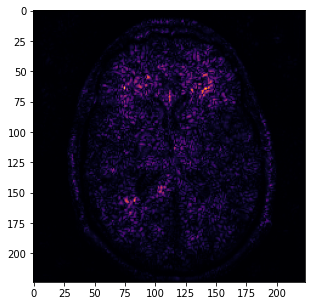

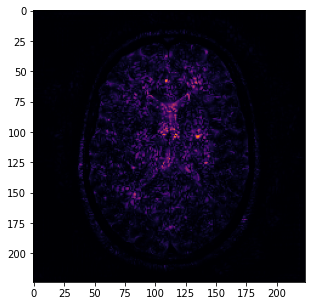

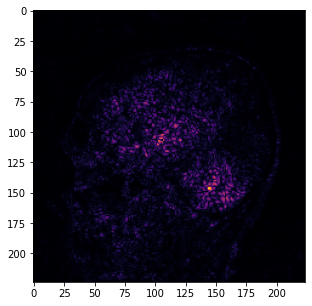

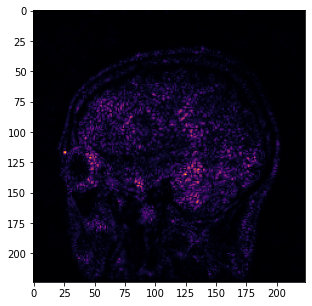

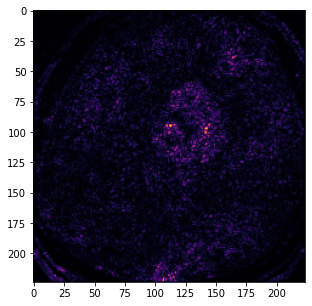

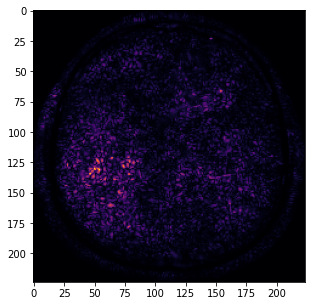

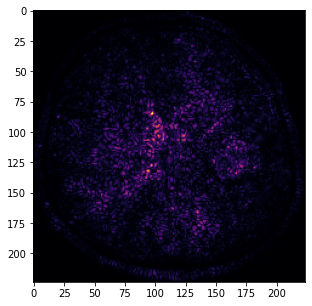

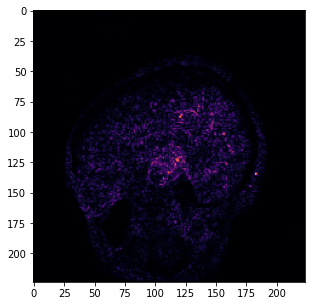

In [ ]:
vgg_att_h1,vgg_plot_h1 = ig_binary.plot(image=vgg_img_h1, baseline=baseline, target_class_idx=vgg_pred_h1,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_h2, vgg_plot_h2 = ig_binary.plot(image=vgg_img_h2, baseline=baseline, target_class_idx=vgg_pred_h2,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_h3, vgg_plot_h3 = ig_binary.plot(image=vgg_img_h3, baseline=baseline, target_class_idx=vgg_pred_h3,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_h4, vgg_plot_h4 = ig_binary.plot(image=vgg_img_h4, baseline=baseline, target_class_idx=vgg_pred_h3,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_t1, vgg_plot_t1 = ig_binary.plot(image=vgg_img_t1, baseline=baseline, target_class_idx=vgg_pred_t1,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_t2, vgg_plot_t2 = ig_binary.plot(image=vgg_img_t2, baseline=baseline, target_class_idx=vgg_pred_t2,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_t3, vgg_plot_t3 = ig_binary.plot(image=vgg_img_t3, baseline=baseline, target_class_idx=vgg_pred_t3,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)
vgg_att_t4, vgg_plot_t4 = ig_binary.plot(image=vgg_img_t4, baseline=baseline, target_class_idx=vgg_pred_t4,model=b_vgg_y_model,m_steps=240, cmap=plt.cm.inferno, overlay_alpha=0.4)

Μέθοδος Saliency Maps

In [ ]:
vgg_simage_h1 = vgg_preprocess.preprocess_saliency(image_h1)
vgg_simage_h2 = vgg_preprocess.preprocess_saliency(image_h2)
vgg_simage_h3 = vgg_preprocess.preprocess_saliency(image_h3)
vgg_simage_h4 = vgg_preprocess.preprocess_saliency(image_h4)
vgg_simage_t1 = vgg_preprocess.preprocess_saliency(image_t1)
vgg_simage_t2 = vgg_preprocess.preprocess_saliency(image_t2)
vgg_simage_t3 = vgg_preprocess.preprocess_saliency(image_t3)
vgg_simage_t4 = vgg_preprocess.preprocess_saliency(image_t4)

In [ ]:
vgg_grads_h1 = saliency.saliency_preproccess(vgg_simage_h1, b_vgg_y_model)
vgg_grads_h2 =  saliency.saliency_preproccess(vgg_simage_h2, b_vgg_y_model)
vgg_grads_h3 =  saliency.saliency_preproccess(vgg_simage_h3, b_vgg_y_model)
vgg_grads_h4 =  saliency.saliency_preproccess(vgg_simage_h4, b_vgg_y_model)
vgg_grads_t1 =  saliency.saliency_preproccess(vgg_simage_t1, b_vgg_y_model)
vgg_grads_t2 =  saliency.saliency_preproccess(vgg_simage_t2, b_vgg_y_model)
vgg_grads_t3 =  saliency.saliency_preproccess(vgg_simage_t3, b_vgg_y_model)
vgg_grads_t4 =  saliency.saliency_preproccess(vgg_simage_t4, b_vgg_y_model)

In [ ]:
vgg_grad_eval_h1 = saliency.make_saliency(vgg_grads_h1)
vgg_grad_eval_h2 = saliency.make_saliency(vgg_grads_h2)
vgg_grad_eval_h3 = saliency.make_saliency(vgg_grads_h3)
vgg_grad_eval_h4 = saliency.make_saliency(vgg_grads_h4)
vgg_grad_eval_t1 = saliency.make_saliency(vgg_grads_t1)
vgg_grad_eval_t2 = saliency.make_saliency(vgg_grads_t2)
vgg_grad_eval_t3 = saliency.make_saliency(vgg_grads_t3)
vgg_grad_eval_t4 = saliency.make_saliency(vgg_grads_t4)

Μέθοδος Smoothgrad

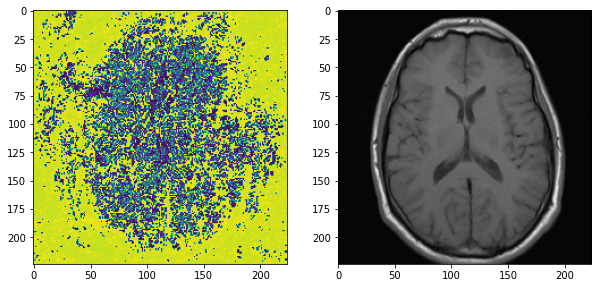

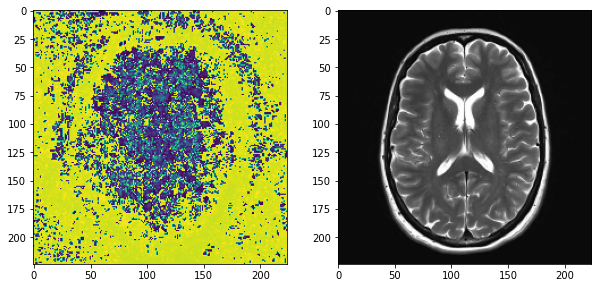

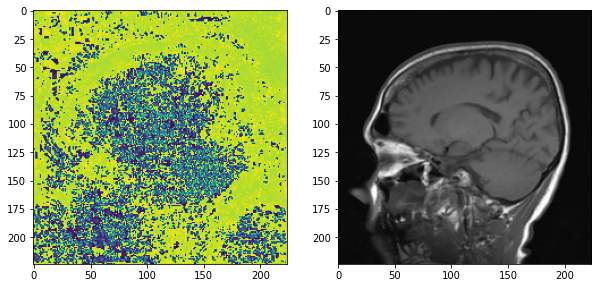

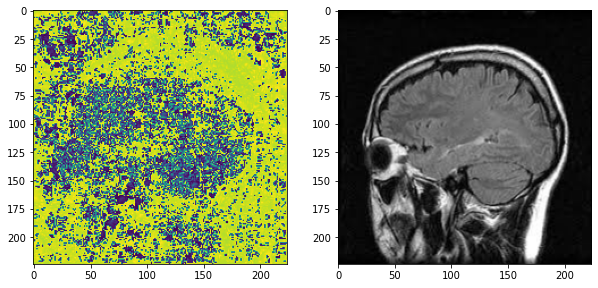

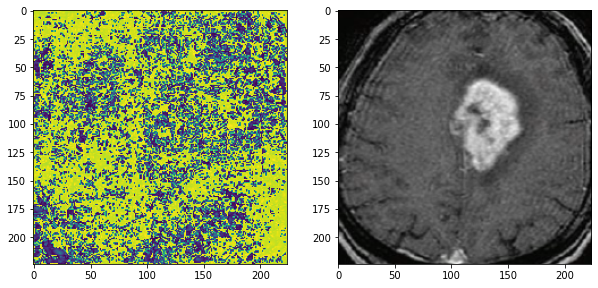

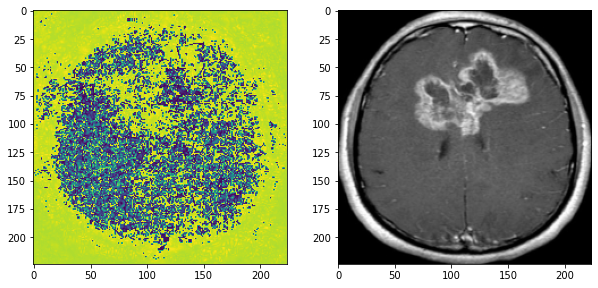

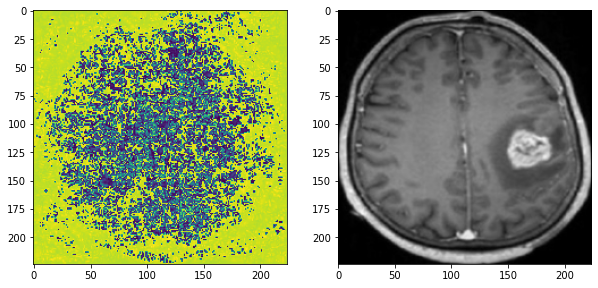

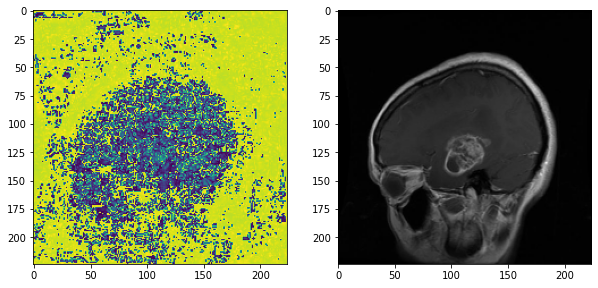

In [ ]:
vgg_grid_h1 = smoothgrad.smoothgrad(image_h1, 2, b_vgg_y_model, 1)
vgg_grid_h2 = smoothgrad.smoothgrad(image_h2, 1, b_vgg_y_model, 1)
vgg_grid_h3 = smoothgrad.smoothgrad(image_h3, 0, b_vgg_y_model, 1)
vgg_grid_h4 = smoothgrad.smoothgrad(image_h4, 3, b_vgg_y_model, 0.5)
vgg_grid_t1 = smoothgrad.smoothgrad(image_t1, 2, b_vgg_y_model, 1)
vgg_grid_t2 = smoothgrad.smoothgrad(image_t2, 1, b_vgg_y_model, 1)
vgg_grid_t3 = smoothgrad.smoothgrad(image_t3, 0, b_vgg_y_model, 1)
vgg_grid_t4 = smoothgrad.smoothgrad(image_t4, 3, b_vgg_y_model, 1)


Μέθοδος LIME

In [ ]:
vgg_top_features_h1, vgg_num_superpixels_h1, vgg_superpixels_h1,img_h1 = lime.lime(image_h1,b_vgg_y_model)
vgg_top_features_h2, vgg_num_superpixels_h2, vgg_superpixels_h2,img_h2 = lime.lime(image_h2,b_vgg_y_model)
vgg_top_features_h3, vgg_num_superpixels_h3, vgg_superpixels_h3,img_h3 = lime.lime(image_h3,b_vgg_y_model)
vgg_top_features_h4, vgg_num_superpixels_h4, vgg_superpixels_h4,img_h4 = lime.lime(image_h4,b_vgg_y_model)
vgg_top_features_t1, vgg_num_superpixels_t1, vgg_superpixels_t1,img_t1 = lime.lime(image_t1,b_vgg_y_model)
vgg_top_features_t2, vgg_num_superpixels_t2, vgg_superpixels_t2,img_t2 = lime.lime(image_t2,b_vgg_y_model)
vgg_top_features_t3, vgg_num_superpixels_t3, vgg_superpixels_t3,img_t3 = lime.lime(image_t3,b_vgg_y_model)
vgg_top_features_t4, vgg_num_superpixels_t4, vgg_superpixels_t4,img_t4 = lime.lime(image_t4,b_vgg_y_model)


Αναπαράσταση αποτελεσμάτων για το VGG16

(0.0, 1.0, 0.0, 1.0)

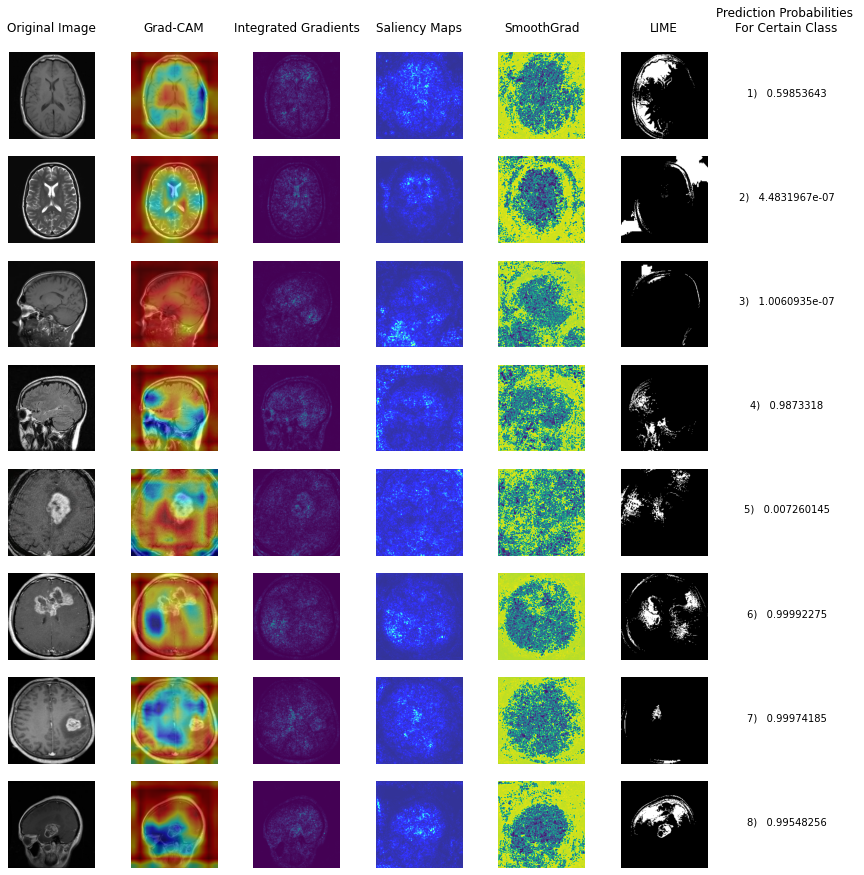

In [ ]:
fig, ax = plt.subplots(8,7,figsize=(15,15))

ax[0,0].set_title("Original Image\n")
ax[0,0].imshow(image_h1)
ax[0,0].axis('off')
ax[1,0].imshow(image_h2)
ax[1,0].axis('off')
ax[2,0].imshow(image_h3)
ax[2,0].axis('off')
ax[3,0].imshow(image_h4)
ax[3,0].axis('off')
ax[4,0].imshow(image_t1)
ax[4,0].axis('off')
ax[5,0].imshow(image_t2)
ax[5,0].axis('off')
ax[6,0].imshow(image_t3)
ax[6,0].axis('off')
ax[7,0].imshow(image_t4)
ax[7,0].axis('off')


ax[0,1].set_title("Grad-CAM\n")
ax[0,1].imshow(vgg_output_h1)
ax[0,1].axis('off')
ax[1,1].imshow(vgg_output_h2)
ax[1,1].axis('off')
ax[2,1].imshow(vgg_output_h3)
ax[2,1].axis('off')
ax[3,1].imshow(vgg_output_h4)
ax[3,1].axis('off')
ax[4,1].imshow(vgg_output_t1)
ax[4,1].axis('off')
ax[5,1].imshow(vgg_output_t2)
ax[5,1].axis('off')
ax[6,1].imshow(vgg_output_t3)
ax[6,1].axis('off')
ax[7,1].imshow(vgg_output_t4)
ax[7,1].axis('off')


ax[0,2].set_title("Integrated Gradients\n")
ax[0,2].imshow(vgg_plot_h1)
ax[0,2].axis('off')
ax[1,2].imshow(vgg_plot_h2)
ax[1,2].axis('off')
ax[2,2].imshow(vgg_plot_h3)
ax[2,2].axis('off')
ax[3,2].imshow(vgg_plot_h4)
ax[3,2].axis('off')
ax[4,2].imshow(vgg_plot_t1)
ax[4,2].axis('off')
ax[5,2].imshow(vgg_plot_t2)
ax[5,2].axis('off')
ax[6,2].imshow(vgg_plot_t3)
ax[6,2].axis('off')
ax[7,2].imshow(vgg_plot_t4)
ax[7,2].axis('off')

ax[0,3].set_title("Saliency Maps\n")
ax[0,3].imshow(vgg_grad_eval_h1,cmap="jet",alpha=0.8)
ax[0,3].axis('off')
ax[1,3].imshow(vgg_grad_eval_h2,cmap="jet",alpha=0.8)
ax[1,3].axis('off')
ax[2,3].imshow(vgg_grad_eval_h3,cmap="jet",alpha=0.8)
ax[2,3].axis('off')
ax[3,3].imshow(vgg_grad_eval_h4,cmap="jet",alpha=0.8)
ax[3,3].axis('off')
ax[4,3].imshow(vgg_grad_eval_t1,cmap="jet",alpha=0.8)
ax[4,3].axis('off')
ax[5,3].imshow(vgg_grad_eval_t2,cmap="jet",alpha=0.8)
ax[5,3].axis('off')
ax[6,3].imshow(vgg_grad_eval_t3,cmap="jet",alpha=0.8)
ax[6,3].axis('off')
ax[7,3].imshow(vgg_grad_eval_t4,cmap="jet",alpha=0.8)
ax[7,3].axis('off')

ax[0,4].set_title("SmoothGrad\n")
ax[0,4].imshow(vgg_grid_h1)
ax[0,4].axis('off')
ax[1,4].imshow(vgg_grid_h2)
ax[1,4].axis('off')
ax[2,4].imshow(vgg_grid_h3)
ax[2,4].axis('off')
ax[3,4].imshow(vgg_grid_h4)
ax[3,4].axis('off')
ax[4,4].imshow(vgg_grid_t1)
ax[4,4].axis('off')
ax[5,4].imshow(vgg_grid_t2)
ax[5,4].axis('off')
ax[6,4].imshow(vgg_grid_t3)
ax[6,4].axis('off')
ax[7,4].imshow(vgg_grid_t4)
ax[7,4].axis('off')

ax[0,5].set_title("LIME\n")
mask = np.zeros(vgg_num_superpixels_h1) 
mask[vgg_top_features_h1]= True #Activate top superpixels
ax[0,5].imshow(lime.perturb_image(vgg_img_h1/2+0.5,mask,vgg_superpixels_h1))
ax[0,5].axis('off')
mask = np.zeros(vgg_num_superpixels_h2) 
mask[vgg_top_features_h2]= True #Activate top superpixels
ax[1,5].imshow(lime.perturb_image(vgg_img_h2/2+0.5,mask,vgg_superpixels_h2))
ax[1,5].axis('off')
mask = np.zeros(vgg_num_superpixels_h3) 
mask[vgg_top_features_h3]= True #Activate top superpixels
ax[2,5].imshow(lime.perturb_image(vgg_img_h3/2+0.5,mask,vgg_superpixels_h3))
ax[2,5].axis('off')
mask = np.zeros(vgg_num_superpixels_h4) 
mask[vgg_top_features_h4]= True #Activate top superpixels
ax[3,5].imshow(lime.perturb_image(vgg_img_h4/2+0.5,mask,vgg_superpixels_h4))
ax[3,5].axis('off')
mask = np.zeros(vgg_num_superpixels_t1) 
mask[vgg_top_features_t1]= True #Activate top superpixels
ax[4,5].imshow(lime.perturb_image(vgg_img_t1/2+0.5,mask,vgg_superpixels_t1))
ax[4,5].axis('off')
amask = np.zeros(vgg_num_superpixels_t2) 
mask[vgg_top_features_t2]= True #Activate top superpixels
ax[5,5].imshow(lime.perturb_image(vgg_img_t2/2+0.5,mask,vgg_superpixels_t2))
ax[5,5].axis('off')
mask = np.zeros(vgg_num_superpixels_t3) 
mask[vgg_top_features_t3]= True #Activate top superpixels
ax[6,5].imshow(lime.perturb_image(vgg_img_t3/2+0.5,mask,vgg_superpixels_t3))
ax[6,5].axis('off')
mask = np.zeros(vgg_num_superpixels_t4) 
mask[vgg_top_features_t4]= True #Activate top superpixels
ax[7,5].imshow(lime.perturb_image(vgg_img_t4/2+0.5,mask,vgg_superpixels_t4))
ax[7,5].axis('off')

ax[0,6].set_title("Prediction Probabilities \nFor Certain Class\n")
ax[0,6].text(0.5, 0.5, str("1)   ")+ str(vgg_pred_h1[0][0]), horizontalalignment='center');
ax[0,6].axis('off')
ax[1,6].text(0.5, 0.5,  str("2)   ")+ str(vgg_pred_h2[0][0]), horizontalalignment='center');
ax[1,6].axis('off')
ax[2,6].text(0.5, 0.5,  str("3)   ")+ str(vgg_pred_h3[0][0]), horizontalalignment='center');
ax[2,6].axis('off')
ax[3,6].text(0.5, 0.5,  str("4)   ")+ str(vgg_pred_h4[0][0]), horizontalalignment='center');
ax[3,6].axis('off')
ax[4,6].text(0.5, 0.5,  str("5)   ")+ str(vgg_pred_t1[0][0]), horizontalalignment='center');
ax[4,6].axis('off')
ax[5,6].text(0.5, 0.5,  str("6)   ")+ str(vgg_pred_t2[0][0]), horizontalalignment='center');
ax[5,6].axis('off')
ax[6,6].text(0.5, 0.5,  str("7)   ")+ str(vgg_pred_t3[0][0]), horizontalalignment='center');
ax[6,6].axis('off')
ax[7,6].text(0.5, 0.5,  str("8)   ")+ str(vgg_pred_t4[0][0]), horizontalalignment='center');
ax[7,6].axis('off')